# Patching Holes From Bad Flats


**Author: Dave Strickland**

**Version: 0.6.0**

This notebook illustrates 

1. The kind of problem that bad flat correction can impart on `iTelescope`-calibrated files
2. How check flats for the issue and one way to correct for it

The python environment used corresponds to a `miniconda` or `mini-forge` environment `ap-env.yml`.

The example master flats used are iTelescope T33 files from June 2024. An example of an affected image is a iTelescope T33 image of NGC 253. Note that these files are not provided with this package. However the notebook should work with your own files if you specify a valid fits-file containing directory at the prompt below.

Although some `matplotlib` images of the dark and bad pixel files are shown, much of the by-hand checking is done using [SAOImage ds9](https://sites.google.com/cfa.harvard.edu/saoimageds9). (Which I highly recommend.) 

## Notebook environment setup

In [1]:
import os
import pathlib
import sys
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import time
import math
import subprocess
import shlex

import scipy
from scipy import ndimage
import skimage as ski
from skimage import restoration
import photutils
import photutils.datasets

from ccdproc import ImageFileCollection
from astropy.table import Table
from astropy import wcs
import astropy
from astropy.io import fits

from astropy.visualization import (
    AsymmetricPercentileInterval,
    MinMaxInterval,
    ManualInterval,
    SqrtStretch,
    AsinhStretch,
    LinearStretch,
    ImageNormalize,
)

import AstroPhotography as ap

In [2]:
def print_module_version(mod):
    """
    Convenience function to pretty-print Python module mod version.

    Arguments:
        mod {module} -- Imported Python module

    Returns:
        str -- module name and version
    """
    print(f"Using module {mod.__name__:30s}  version: {mod.__version__}")
    return

In [3]:
# Get Version information
print(f'Python version: {sys.version}')
for mod in [np, matplotlib, astropy, ap, scipy, ski, photutils]:
    print_module_version(mod)


Python version: 3.12.9 | packaged by conda-forge | (main, Mar  4 2025, 22:48:41) [GCC 13.3.0]
Using module numpy                           version: 2.2.3
Using module matplotlib                      version: 3.10.1
Using module astropy                         version: 7.0.1
Using module AstroPhotography                version: 0.6.1
Using module scipy                           version: 1.15.2
Using module skimage                         version: 0.25.2
Using module photutils                       version: 2.2.0


In [4]:
# Enable inline plotting for graphics
# %matplotlib inline
# Set default figure size to be larger
# this may only work in matplotlib 2.0+!
from IPython.core.interactiveshell import InteractiveShell
matplotlib.rcParams['figure.figsize'] = [10.0, 6.0]
# Enable multiple outputs from jupyter cells
InteractiveShell.ast_node_interactivity = "all"

# Problems From Bad Flats

## NGC 253 with T33 

Let us change the working directory from the location of this notebook to a directory holding some iTelescope T33 images of NGC 253. The images we'll look at are the `raw` FITS image off the telescpope, the `calibrated` image that iTelescope provides using their own caibration pipeline, and a "recalibrated" file generated by the pre-processing stage of `ApProcess` that has had better bad pixel correction and cosmic-ray rejection applied.

**Note:** I have renamed the iTelescope files to replace whitespace characters with underscores.

In [5]:
default_path = '/old_lnx/home/dks/Downloads/iTelescopeScratch/T33/NGC_253/Processed'
print(f'Enter the full path to the directory containing the master dark calibration files, or return to accept {default_path}')
wdir = input('Image file set path:').strip() or default_path
try:
    os.chdir(wdir.strip())
    print('Switched directory to ' + os.getcwd())
except:
    print(f'Error, os.chdir threw an exception changing to {wdir}')
    print('Check that the path you supplied is a valid filesystem path.')
    raise

Enter the full path to the directory containing the master dark calibration files, or return to accept /old_lnx/home/dks/Downloads/iTelescopeScratch/T33/NGC_253/Processed


Image file set path: 


Switched directory to /old_lnx/home/dks/Downloads/iTelescopeScratch/T33/NGC_253/Processed


Listing one example observation file from the shell I get:
```bash
ls -1 *20240828-010621*
calibrated-T33-davestrickland-NGC_253-20240828-010621-Blue-BIN1-E-180-001.fit
raw-T33-davestrickland-NGC_253-20240828-010621-Blue-BIN1-E-180-001.fit
recalibrated-T33-davestrickland-NGC_253-20240828-010621-Blue-BIN1-E-180-001.fit
```

In [6]:
default_pattern = '*20240828-010621*fit*'
print(f'Default file pattern for input files: {default_pattern}')
msg = 'Enter new input file pattern (or return to accept default pattern)'
file_pattern = input(msg).strip() or default_pattern
print(f'Using "{file_pattern}" as the input file pattern.')

Default file pattern for input files: *20240828-010621*fit*


Enter new input file pattern (or return to accept default pattern) 


Using "*20240828-010621*fit*" as the input file pattern.


In [7]:

p_dir = pathlib.Path(r'./')
flist = list(sorted(p_dir.glob(file_pattern)))
print(f'{len(flist)} files match pattern "{file_pattern}" in current directory.')
for fpath in flist:
    print(f'  {fpath}')

3 files match pattern "*20240828-010621*fit*" in current directory.
  calibrated-T33-davestrickland-NGC_253-20240828-010621-Blue-BIN1-E-180-001.fit
  raw-T33-davestrickland-NGC_253-20240828-010621-Blue-BIN1-E-180-001.fit
  recalibrated-T33-davestrickland-NGC_253-20240828-010621-Blue-BIN1-E-180-001.fit


The path to the associated master flat file is hard coded as a default, but you can enter your own path to override  it.

In [8]:
default_flat_path = '/old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Blue_1_Blue_4096x4096_Bin1x1_Temp-15C_ExpTime4s.fit.gz'
print(f'Enter the full path to the master flat file associated with the image files chosen previously, or hit return to accept {default_flat_path}')
flat_file = input('Master flat file path:').strip() or default_flat_path
if pathlib.Path(flat_file).exists():
    print(f'Using {flat_file} as the Master Flat')
else:
    print(f'Error, input Master File does not exist or cannot be accessed.')
    print('Check that the path you supplied is a valid filesystem path.')

Enter the full path to the master flat file associated with the image files chosen previously, or hit return to accept /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Blue_1_Blue_4096x4096_Bin1x1_Temp-15C_ExpTime4s.fit.gz


Master flat file path: 


Using /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Blue_1_Blue_4096x4096_Bin1x1_Temp-15C_ExpTime4s.fit.gz as the Master Flat


In [9]:
# Look at the files in ds9. Note the annoying spaces cause trouble...
show_in_ds9=False

if show_in_ds9:
    import shutil
    if shutil.which("ds9") is not None:
        print('Calling shell to execute ds9...')
        files = " ".join([str(x) for x in flist]) + " " +  f'{flat_file}'
        print(f'files=[{files}]')
        !ds9 -cmap viridis -asinh -scale mode 99.5 -zoom to 0.5 physical $files
    else:
        print('No ds9 was found in your $PATH')

The following loads the three versions of the same T33 image of NGC 253, and plots a 1000 x 1000 pixel region, which is zoomed in enough to start to spot the small blemishes associated with the bad master flat. (The full images are 4096x4096)

In [10]:
# Load the three images and the flat
imlist=[str(x) for x in flist]
imlist.append( flat_file )
imsize=1000
xcen=2200
ycen=3050
x_limits=[xcen-0.5*imsize, xcen-1+0.5*imsize]
y_limits=[ycen-0.5*imsize, ycen-1+0.5*imsize]
ap.util.load_imlist_and_plot(imlist, extnum=0, output='t33_holes1.png', usewcs=False, xaxlim=x_limits, yaxlim=y_limits)

The are 4 FITS images in the input imlist
  With 4 files the plot layout is 2 rows x 2 columns.
Attempting to plot calibrated-T33-davestrickland-NGC_253-20240828-010621-Blue-BIN1-E-180-001.fit
  Input image data 0.5th percentile = 83.6464, 99.5th percentile = 153.3088
  Applying asinh stretch between 83.6464 and 153.3088
Default X-axis limits: (np.float64(-0.5), np.float64(4095.5))
Default Y-axis limits: (np.float64(-0.5), np.float64(4095.5))
Setting X-axis limits to [1700.0, 2699.0]
Setting Y-axis limits to [2550.0, 3549.0]
Attempting to plot raw-T33-davestrickland-NGC_253-20240828-010621-Blue-BIN1-E-180-001.fit
  Input image data 0.5th percentile = 1411.0000, 99.5th percentile = 1515.0000
  Applying asinh stretch between 1411.0000 and 1515.0000
Default X-axis limits: (np.float64(-0.5), np.float64(4095.5))
Default Y-axis limits: (np.float64(-0.5), np.float64(4095.5))
Setting X-axis limits to [1700.0, 2699.0]
Setting Y-axis limits to [2550.0, 3549.0]
Attempting to plot recalibrated-T33

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


  Input image data 0.5th percentile = 84.1606, 99.5th percentile = 151.5007
  Applying asinh stretch between 84.1606 and 151.5007
Default X-axis limits: (np.float64(-0.5), np.float64(4095.5))
Default Y-axis limits: (np.float64(-0.5), np.float64(4095.5))
Setting X-axis limits to [1700.0, 2699.0]
Setting Y-axis limits to [2550.0, 3549.0]
Attempting to plot /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Blue_1_Blue_4096x4096_Bin1x1_Temp-15C_ExpTime4s.fit.gz
  Input image data 0.5th percentile = 16593.6415, 99.5th percentile = 30417.6055
  Applying asinh stretch between 16593.6415 and 30417.6055
Default X-axis limits: (np.float64(-0.5), np.float64(4095.5))
Default Y-axis limits: (np.float64(-0.5), np.float64(4095.5))
Setting X-axis limits to [1700.0, 2699.0]
Setting Y-axis limits to [2550.0, 3549.0]
Wrote plot to t33_holes1.png


At this level of zoom the calibrated image (top left) looks fine, while bad columns are visible in the raw data (top right). But the recalibrated image (bottom left) shows clear low-count blemishes in multiple locations, matched in the master flat (bottom right).

To get a better look at this, we'll zoom in around the blemish at column 2280 and row 2980 (approximately).

In [11]:
# make a copy of imlist for later use
orig_imlist = imlist

In [12]:
# Zooming in closer
imsize=50
xcen=2280
ycen=2980
x_limits=[xcen-0.5*imsize, xcen-1+0.5*imsize]
y_limits=[ycen-0.5*imsize, ycen-1+0.5*imsize]
ap.util.load_imlist_and_plot(imlist, extnum=0, output='t33_holes2.png', usewcs=False, xaxlim=x_limits, yaxlim=y_limits)

The are 4 FITS images in the input imlist
  With 4 files the plot layout is 2 rows x 2 columns.
Attempting to plot calibrated-T33-davestrickland-NGC_253-20240828-010621-Blue-BIN1-E-180-001.fit
  Input image data 0.5th percentile = 83.6464, 99.5th percentile = 153.3088
  Applying asinh stretch between 83.6464 and 153.3088
Default X-axis limits: (np.float64(-0.5), np.float64(4095.5))
Default Y-axis limits: (np.float64(-0.5), np.float64(4095.5))
Setting X-axis limits to [2255.0, 2304.0]
Setting Y-axis limits to [2955.0, 3004.0]
Attempting to plot raw-T33-davestrickland-NGC_253-20240828-010621-Blue-BIN1-E-180-001.fit
  Input image data 0.5th percentile = 1411.0000, 99.5th percentile = 1515.0000
  Applying asinh stretch between 1411.0000 and 1515.0000
Default X-axis limits: (np.float64(-0.5), np.float64(4095.5))
Default Y-axis limits: (np.float64(-0.5), np.float64(4095.5))
Setting X-axis limits to [2255.0, 2304.0]
Setting Y-axis limits to [2955.0, 3004.0]
Attempting to plot recalibrated-T33

In the calibrated file the large blemish is visible as a mixed region of low (zero) and high pixel values (top left). There is only a small reduction in brightness visible in the raw image at the site of the large blemishes in the iTelescope-provided calibrated file (top right), consistent with a piece of dust or dirt on the mirror or lenses. In the recalibrated image (bottom left) the bad pixel and CR correction has not corrected the problem region, although it has fixed some residual bad pixels visit in the calibrated image. The blemishes are very visible in the master flat (bottom right), which is therefor their source in the calibrated image.

## Identifying and Correcting Holes from the Master Flats

There are two ways forward: 

1. We could fix the master flats themselves to remove these small-scale discontinuities , then reprocess the raw data, skipping the iTelescope provided calibrated files.
2. We could attempt to fix the calibrated images themselves by some form of interpolation over or in-painting of these holes.

The first option has the following pros and cons:

* Pro: The general high S/N and smoothness of the master flat outside of this holes means that interpolation or in-filling of the holes will yield a smooth result.
* Con: We wanted to operate on calibrated files to avoid having to do the raw file processing, which currently depends on a bash script.
* Con: Using cleaned master flats will leave the dust (?) marks faintly visible in the calibrated images.

The second option  has the following pros and cons:

* Pro: Does not require processing raw files, and can be used in hypothetical cases where there are no available raw files.
* Con: The quality of the interpolation will be impacted by the noise characteristics of the calibrated image, and could introduce artifacts in cases where stars are on the edge of the affected region.

In [13]:
imsize=200
xcen=2350
ycen=2950
x_limits=[xcen-0.5*imsize, xcen-1+0.5*imsize]
y_limits=[ycen-0.5*imsize, ycen-1+0.5*imsize]

In [14]:
def quick_plot_region(imdata, x_limits, y_limits, title_str,   vmin: float = None,
    vmax: float = None, verbose: bool = False):
    ipctls = [0.5, 99.5]
    opctls = np.nanpercentile(imdata, ipctls)
    ourmin = opctls[0]
    ourmax = opctls[1]
    if verbose:
        print(f"Input data 0.5th percentile = {ourmin:.4f}, 99.5th percentile = {ourmax:.4f}")

    if vmin is not None:
        ourmin = vmin
    if vmax is not None:
        ourmax = vmax
    if verbose:
        print(f"Applying asinh stretch between {ourmin:.4f} and {ourmax:.4f}")
    norm = ImageNormalize(
        imdata, interval=ManualInterval(ourmin, ourmax), stretch=AsinhStretch()
    )
    
    fig, axs = plt.subplots(1, 2, layout="constrained")
    axim1 = axs[0].imshow(imdata, origin="lower", norm=norm)
    axs[0].set_title(title_str, fontsize=8)
    cbar1 = fig.colorbar(
        axim1,
        ax=axs[0],
        extend="neither",
        spacing="proportional",
        orientation="vertical",
        shrink=0.85,
    )
    
    axim2 = axs[1].imshow(imdata, origin="lower", norm=norm)
    axs[1].set_title(f'zoomed: {title_str}', fontsize=8)
    axs[1].set_xbound(lower=x_limits[0], upper=x_limits[1])
    axs[1].set_ybound(lower=y_limits[0], upper=y_limits[1])
    cbar2 = fig.colorbar(
        axim2,
        ax=axs[1],
        extend="neither",
        spacing="proportional",
        orientation="vertical",
        shrink=0.85,
    )
    return

flat_data data min=1681.76, max=67941.94, mean=26047.56 +/- 2374.31, median=25817.84 ADU.
  90% of data between 23023.21 and 29965.72 ADU (5-95 precentiles)
  98% of data between 19146.07 and 30335.39 ADU (1-99 precentiles)


[np.float32(1681.7568),
 np.float32(67941.94),
 np.float32(26047.562),
 np.float32(2374.3142),
 np.float64(25817.841796875)]

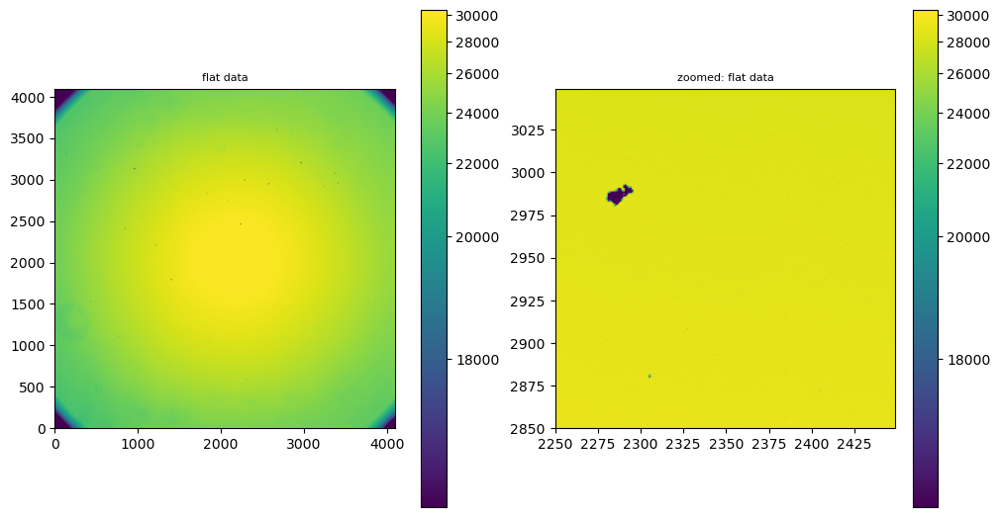

In [15]:
hdulist = fits.open(flat_file)
flat_data = hdulist[0].data

ap.util.img_stats(flat_data, "flat_data", True)

quick_plot_region(flat_data, x_limits, y_limits, "flat data")

Image median value is 25817.841796875
Normalized flat_data data min=0.07, max=2.63, mean=1.01 +/- 0.09, median=1.00 ADU.
  90% of data between 0.89 and 1.16 ADU (5-95 precentiles)
  98% of data between 0.74 and 1.17 ADU (1-99 precentiles)


[np.float32(0.06513932),
 np.float32(2.6315885),
 np.float32(1.0088965),
 np.float32(0.0919641),
 np.float64(1.0)]

flat_data gradient data min=0.00, max=0.47, mean=0.00 +/- 0.00, median=0.00 ADU.
  90% of data between 0.00 and 0.01 ADU (5-95 precentiles)
  98% of data between 0.00 and 0.01 ADU (1-99 precentiles)
Gradient threshold = 0.020155 ADU


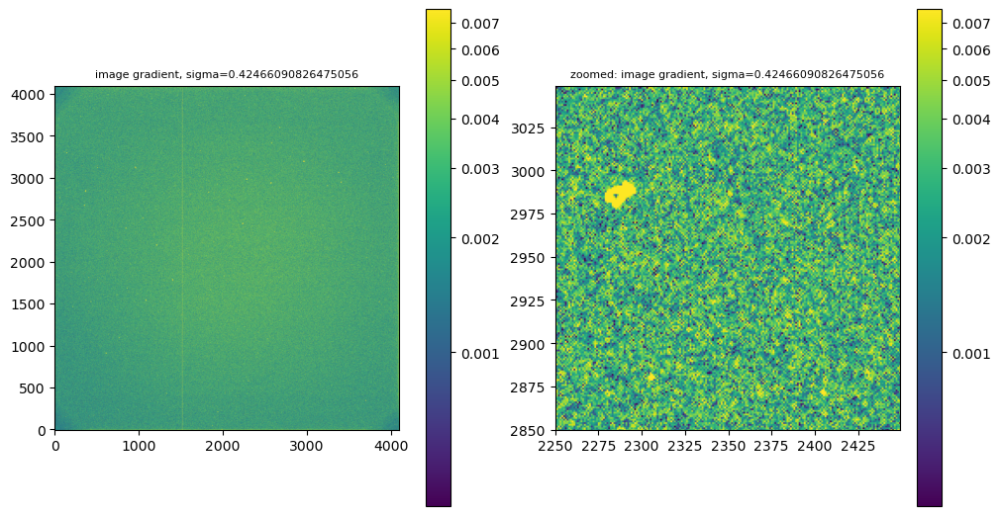

In [16]:
# Renormalize
medval = np.median(flat_data)
print(f'Image median value is {medval}')
norm_flat_data = flat_data / medval

ap.util.img_stats(norm_flat_data, 'Normalized flat_data', True)

# Gaussian FWHM = 2.35482 sigma
sigma_pix = 1.0 / 2.35482
flat_data_gradient = ndimage.gaussian_gradient_magnitude(norm_flat_data, sigma=sigma_pix)

[minval, maxval, meanval, stdval, medval] = ap.util.img_stats(flat_data_gradient, 'flat_data gradient', True)
thresh_nsigma = 5.0
thresh_gradient = meanval + thresh_nsigma*stdval
print(f'Gradient threshold = {thresh_gradient:.6f} ADU')

quick_plot_region(flat_data_gradient, x_limits, y_limits, f'image gradient, sigma={sigma_pix}')

Input data 0.5th percentile = 0.0000, 99.5th percentile = 0.0000
Applying asinh stretch between 0.0000 and 1.0000
Total number of affected pixels: 7553


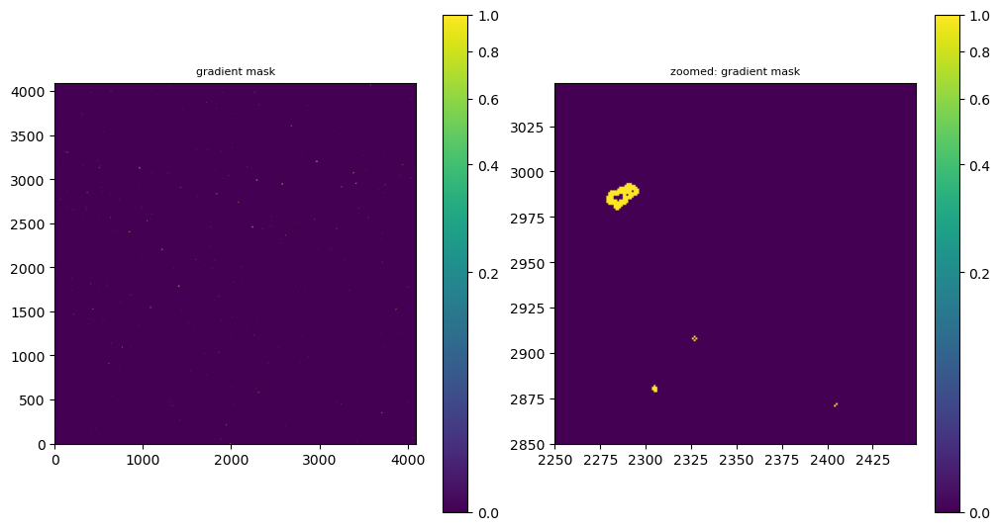

In [17]:
grad_mask = (flat_data_gradient > thresh_gradient).astype(np.int16)
quick_plot_region(grad_mask, x_limits, y_limits, 'gradient mask', 0, 1, True)
print(f'Total number of affected pixels: {np.sum(grad_mask)}')

Input data 0.5th percentile = 0.0000, 99.5th percentile = 0.0000
Applying asinh stretch between 0.0000 and 1.0000
Total number of affected pixels: 8106


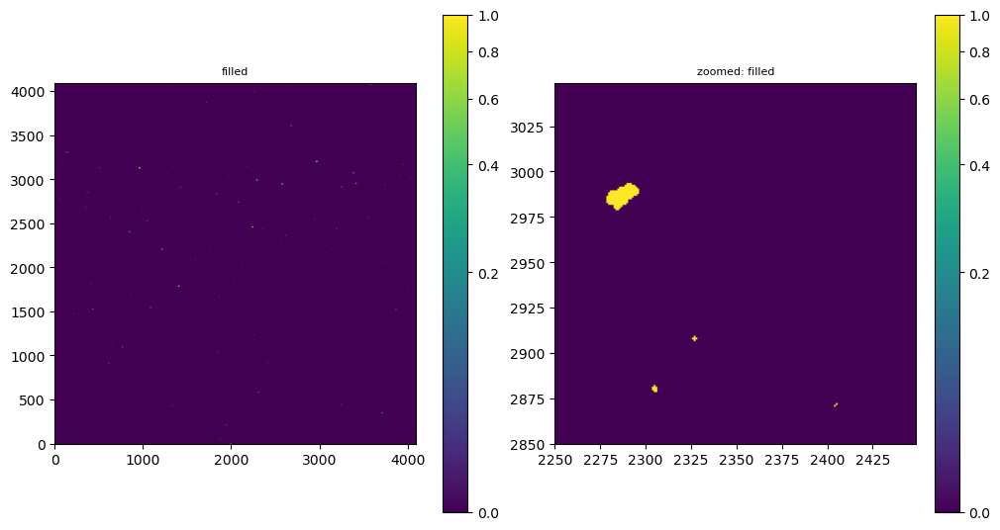

In [18]:
filled = ndimage.binary_fill_holes(grad_mask).astype(np.int16)
quick_plot_region(filled, x_limits, y_limits, 'filled', 0, 1, True)
print(f'Total number of affected pixels: {np.sum(filled)}')

Total number of affected pixels: 20727
Input data 0.5th percentile = 0.0000, 99.5th percentile = 0.0000
Applying asinh stretch between 0.0000 and 1.0000


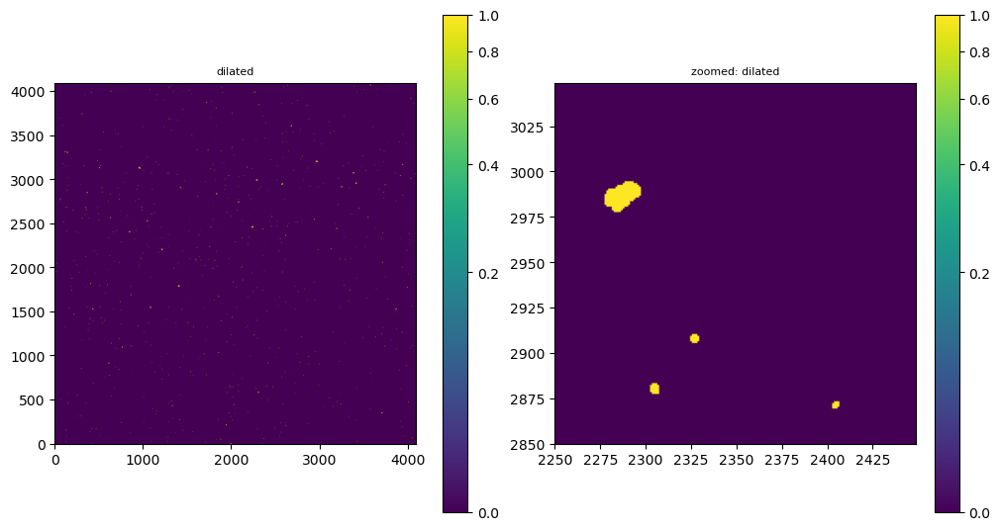

In [19]:
struct1 = ndimage.generate_binary_structure(2, 1)
struct2 = ndimage.generate_binary_structure(2, 2)
do_erosion = False
if do_erosion:
    filled = ndimage.binary_erosion(filled, structure=struct1).astype(np.int16)
    print(f'Total number of affected pixels: {np.sum(grad_mask)}')
dilated = ndimage.binary_dilation(filled, structure=struct2).astype(np.int16)
print(f'Total number of affected pixels: {np.sum(dilated)}')
quick_plot_region(dilated, x_limits, y_limits, 'dilated', 0, 1, True)

---

Now we need to use the final mask to correct the original image

**Important:** skimage.restoration.inpaint_biharmonic must have input data in the range `[0, 1]`. Which I only found out by some careful testing.

## Are The Holes The Same On Each Filter?

Are the artifacts different on each flat, or can we generate a single mask that represents all the flats?

In [20]:
default_flat_dir = '/old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/'
print(f'Enter the full path of the directory containing the master flat files, or hit return to accept {default_flat_dir}')
flat_dir = input('Master flat directory:').strip() or default_flat_dir
if pathlib.Path(flat_file).exists():
    print(f'Using {flat_file} as the Master Flat')
else:
    print(f'Error, input Master File does not exist or cannot be accessed.')
    print('Check that the path you supplied is a valid filesystem path.')

Enter the full path of the directory containing the master flat files, or hit return to accept /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/


Master flat directory: 


Using /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Blue_1_Blue_4096x4096_Bin1x1_Temp-15C_ExpTime4s.fit.gz as the Master Flat


In [21]:
p_dir = pathlib.Path(flat_dir)
file_pattern = 'Master_Flat*fit*'
flist = list(sorted(p_dir.glob(file_pattern)))
print(f'{len(flist)} files match pattern "{file_pattern}" in current directory.')
for fpath in flist:
    print(f'  {fpath}')

7 files match pattern "Master_Flat*fit*" in current directory.
  /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Blue_1_Blue_4096x4096_Bin1x1_Temp-15C_ExpTime4s.fit.gz
  /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Green_1_Green_4096x4096_Bin1x1_Temp-15C_ExpTime5s.fit.gz
  /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Ha_1_Ha_4096x4096_Bin1x1_Temp-15C_ExpTime20s.fit.gz
  /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Luminance_1_Luminance_4096x4096_Bin1x1_Temp-15C_ExpTime3s.fit.gz
  /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_OIII_1_OIII_4096x4096_Bin1x1_Temp-15C_ExpTime17s.fit.gz
  /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Red_1_Red_4096x4

In [22]:
def make_norm_flat_and_mask(flat_file_name: str, 
                            do_plot: bool = False,
                            badpixelfile: str|None = None,
                            deltapix: int = 2,):
    """
    """
    with fits.open(flat_file_name) as hdulist:
        print(f'Processing {flat_file_name}')
        flat_data = hdulist[0].data

        bad_pixel_fixer = None
        if badpixelfile is not None:
            extnum = 0
            bad_pixel_fixer = ap.ApFixBadPixels('info')
            badpix_hdulist = fits.open(badpixelfile)
            msk_data = badpix_hdulist[extnum].data
            flat_data, out_dict = bad_pixel_fixer.fix_bad_pixels(flat_data, msk_data, deltapix)
            badpix_hdulist.close()
        
        # Renormalize
        medval = np.median(flat_data)
        print(f'  Image median value is {medval}')
        norm_flat_data = flat_data / medval
        ap.util.img_stats(norm_flat_data, 'Normalized flat_data', True)

        # Gaussian FWHM = 2.35482 sigma, so to smooth to npix FWHM do...
        npix = 1.5
        sigma_pix = npix / 2.35482
        flat_data_gradient = ndimage.gaussian_gradient_magnitude(norm_flat_data, sigma=sigma_pix)

        [minval, maxval, meanval, stdval, medval] = ap.util.img_stats(flat_data_gradient, 'flat_data gradient', True)
        thresh_nsigma = 5.0
        thresh_gradient = meanval + thresh_nsigma*stdval
        print(f'  Gradient threshold = {thresh_gradient:.6f} ADU')

        if do_plot:
            quick_plot_region(flat_data_gradient, x_limits, y_limits, f'image gradient, sigma={sigma_pix}')

        grad_mask = (flat_data_gradient > thresh_gradient).astype(np.int16)
        filled = ndimage.binary_fill_holes(grad_mask).astype(np.int16)
        
        struct1 = ndimage.generate_binary_structure(2, 1)
        struct2 = ndimage.generate_binary_structure(2, 2)

        # to remove features smaller than the structuring element do an opening.
        # may be useful if we pick up bad pixels that we would otherwise correct
        # in a different way
        do_opening = True
        if do_erosion:
            filled = ndimage.binary_opening(filled, structure=struct2).astype(np.int16)
        
        final_mask = ndimage.binary_dilation(filled, structure=struct2).astype(np.int16)
        print(f'  Total number of pixels in mask: {np.sum(final_mask)}')
        if do_plot:
            quick_plot_region(final_mask, x_limits, y_limits, 'Final mask', 0, 1, True)

        return flat_data, final_mask

Processing /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Blue_1_Blue_4096x4096_Bin1x1_Temp-15C_ExpTime4s.fit.gz
  Image median value is 25817.841796875
Normalized flat_data data min=0.07, max=2.63, mean=1.01 +/- 0.09, median=1.00 ADU.
  90% of data between 0.89 and 1.16 ADU (5-95 precentiles)
  98% of data between 0.74 and 1.17 ADU (1-99 precentiles)
flat_data gradient data min=0.00, max=0.56, mean=0.00 +/- 0.00, median=0.00 ADU.
  90% of data between 0.00 and 0.01 ADU (5-95 precentiles)
  98% of data between 0.00 and 0.01 ADU (1-99 precentiles)
  Gradient threshold = 0.026302 ADU
  Total number of pixels in mask: 19942
Input data 0.5th percentile = 0.0000, 99.5th percentile = 0.0000
Applying asinh stretch between 0.0000 and 1.0000
Processing /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Green_1_Green_4096x4096_Bin1x1_Temp-15C_ExpTime5s.fit.gz
  Image median value is 2586

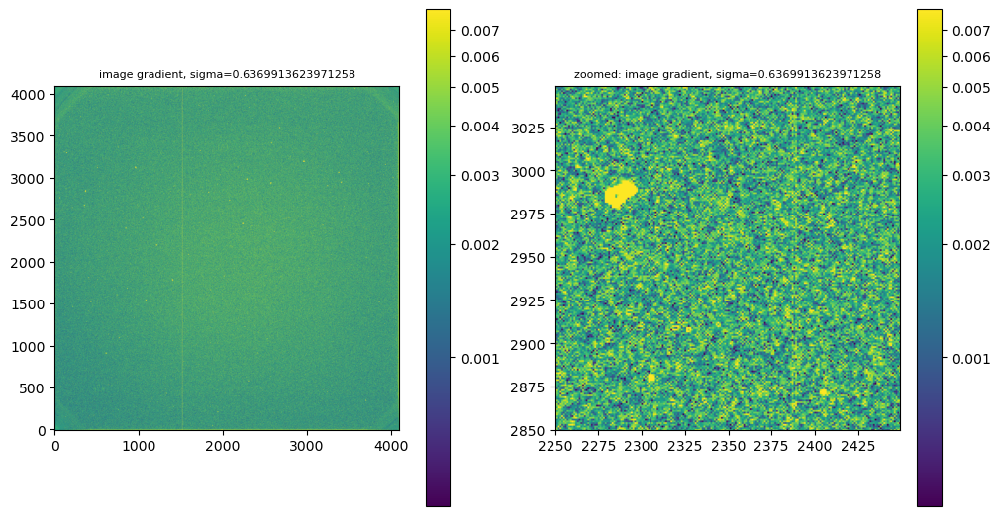

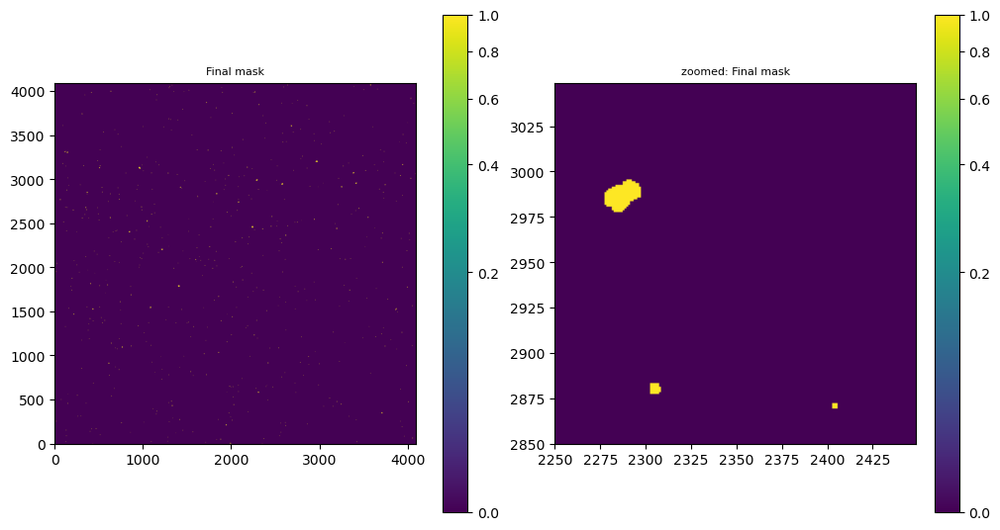

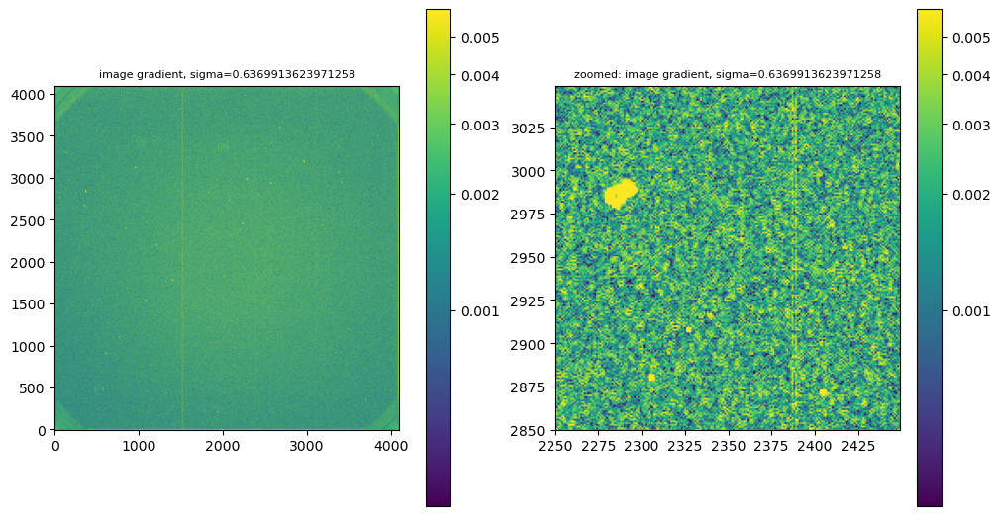

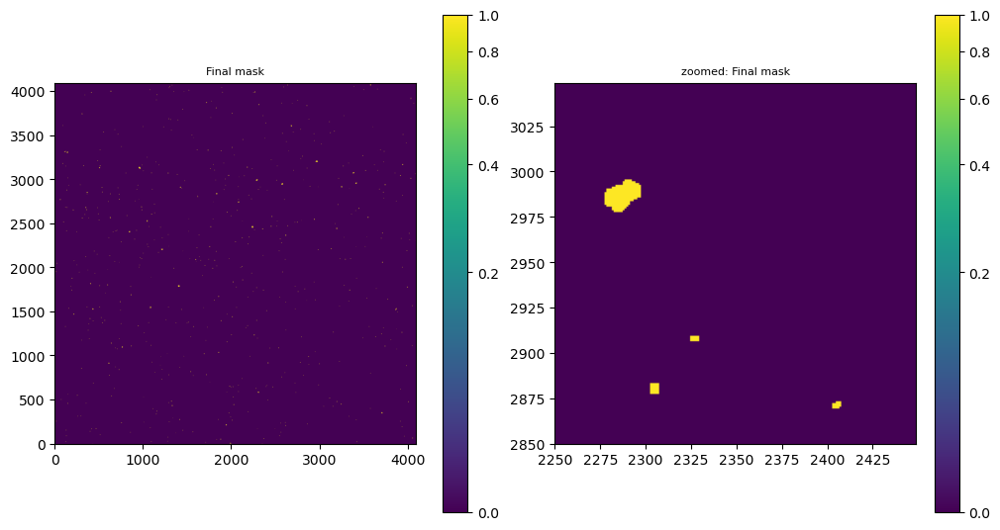

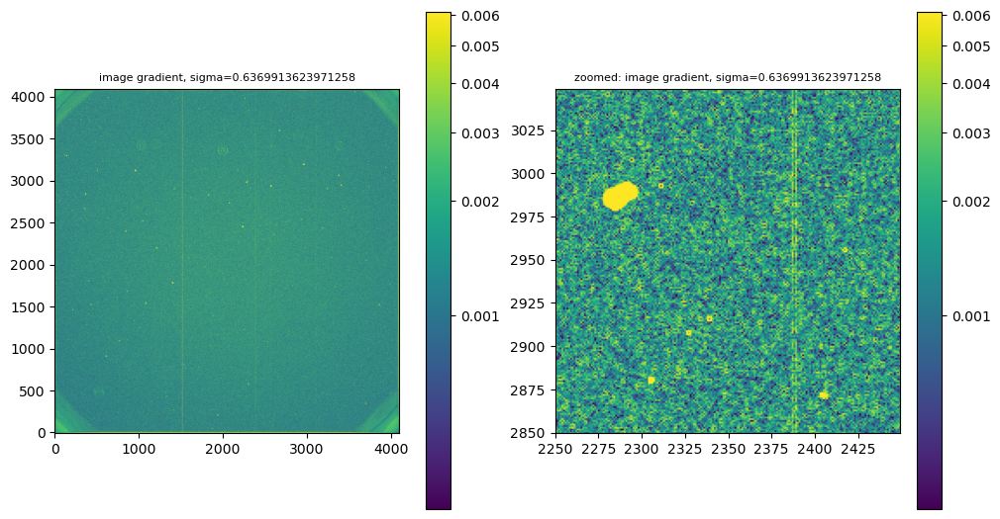

...

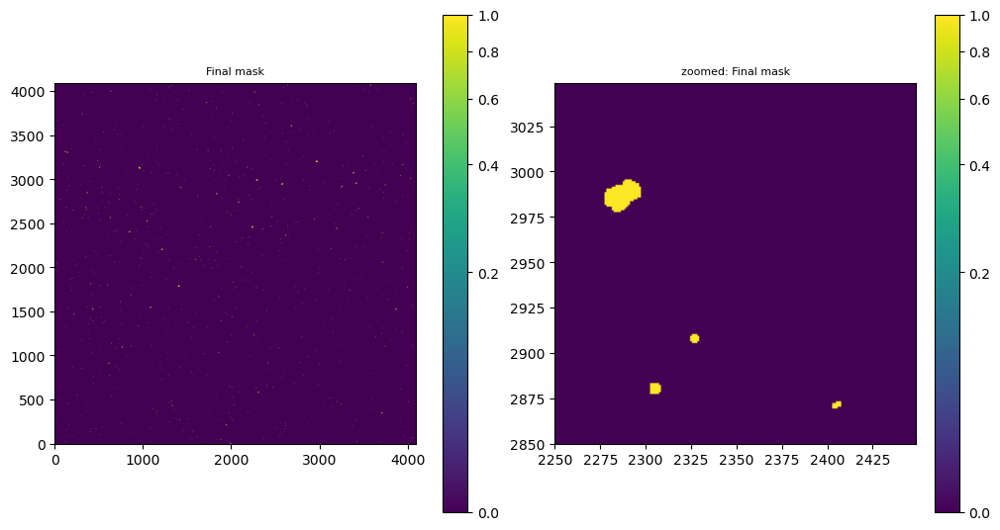

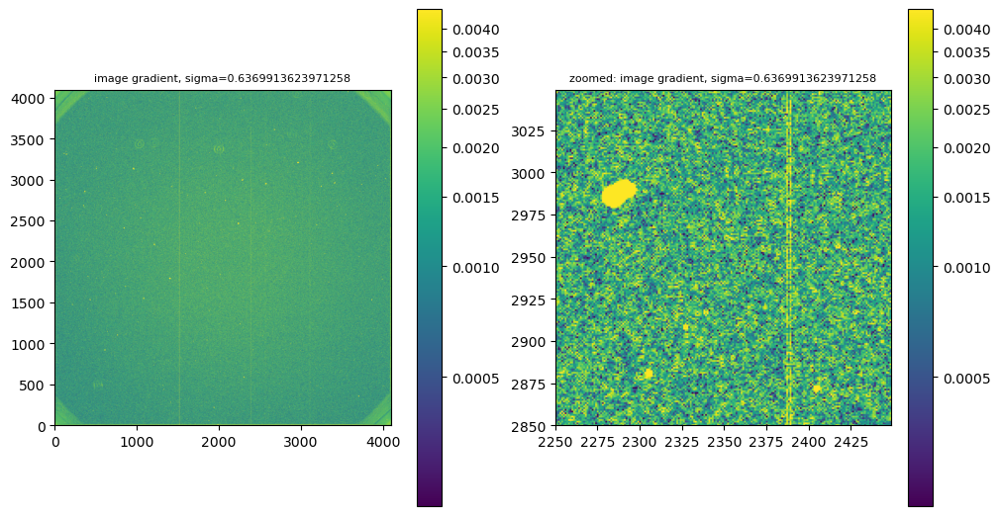

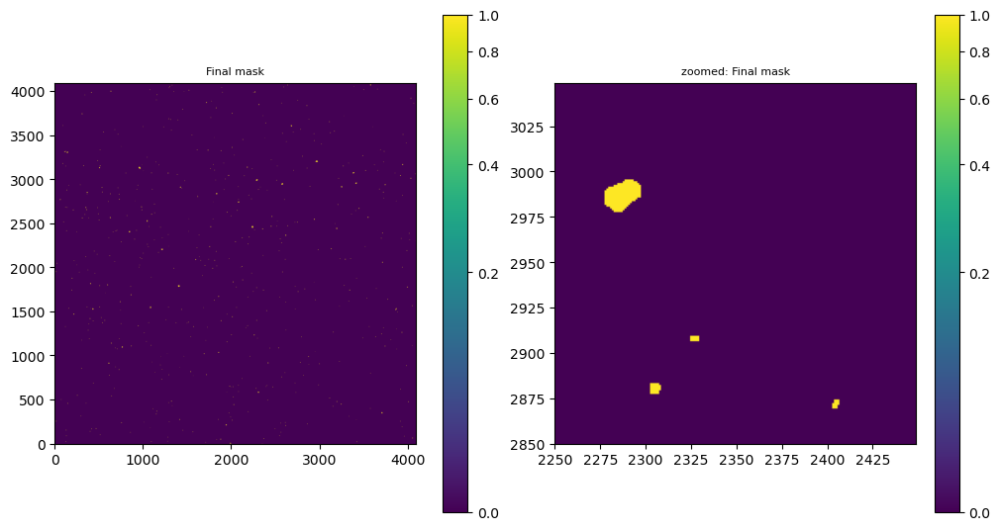

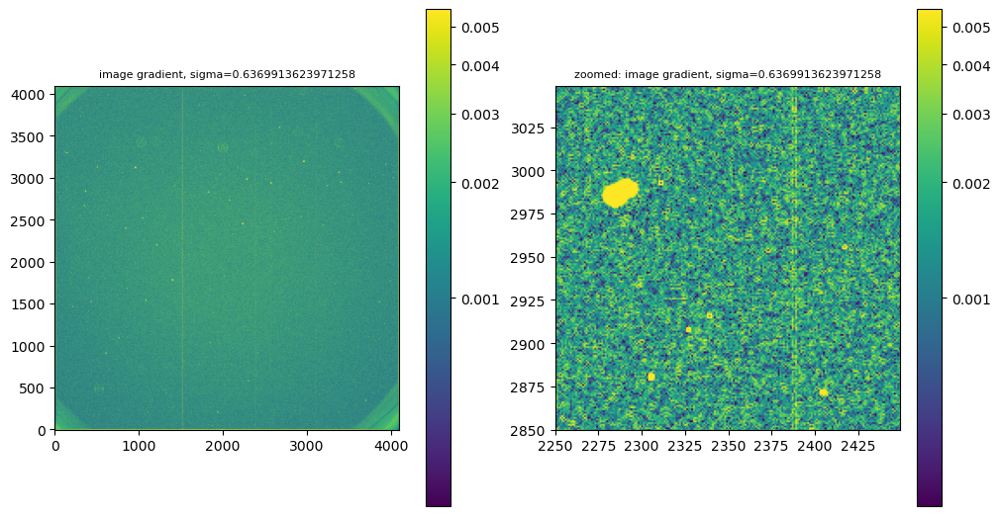

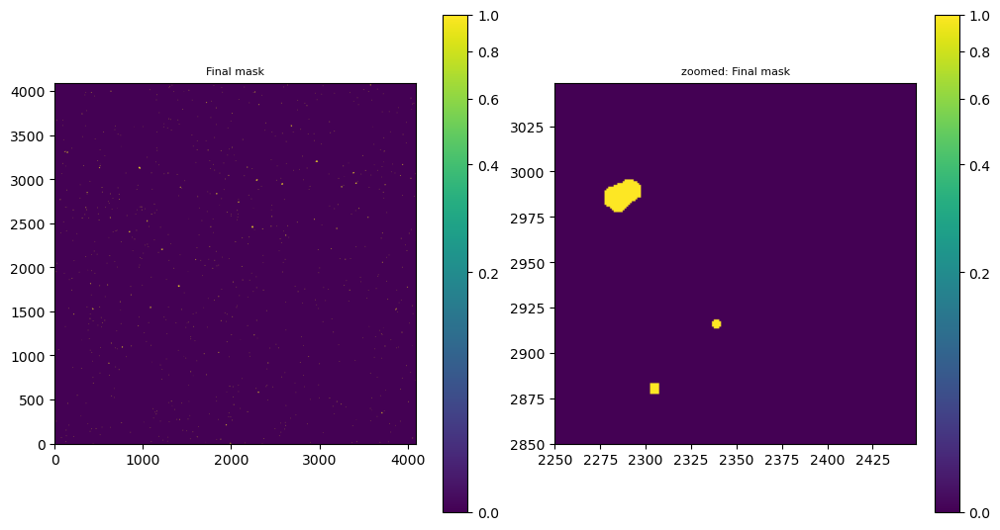

In [23]:
fdata_list = []
fmask_list = []
for fpath in flist:
    (a_data, a_mask) = make_norm_flat_and_mask(fpath, True)
    fdata_list.append( a_data )
    fmask_list.append( a_mask )

In [24]:
merged_mask = None
for a_mask in fmask_list:
    # combine masks
    if merged_mask is None:
        merged_mask = a_mask.copy()
    else:
        merged_mask = np.logical_or(merged_mask, a_mask).astype(np.int16)

    nbad = np.sum(merged_mask)
    print(f'Number of bad pixels associated with holes: {nbad}')

Number of bad pixels associated with holes: 19942
Number of bad pixels associated with holes: 20559
Number of bad pixels associated with holes: 25567
Number of bad pixels associated with holes: 25891
Number of bad pixels associated with holes: 26079
Number of bad pixels associated with holes: 26124
Number of bad pixels associated with holes: 28322


Input data 0.5th percentile = 0.0000, 99.5th percentile = 0.0000
Applying asinh stretch between 0.0000 and 1.0000


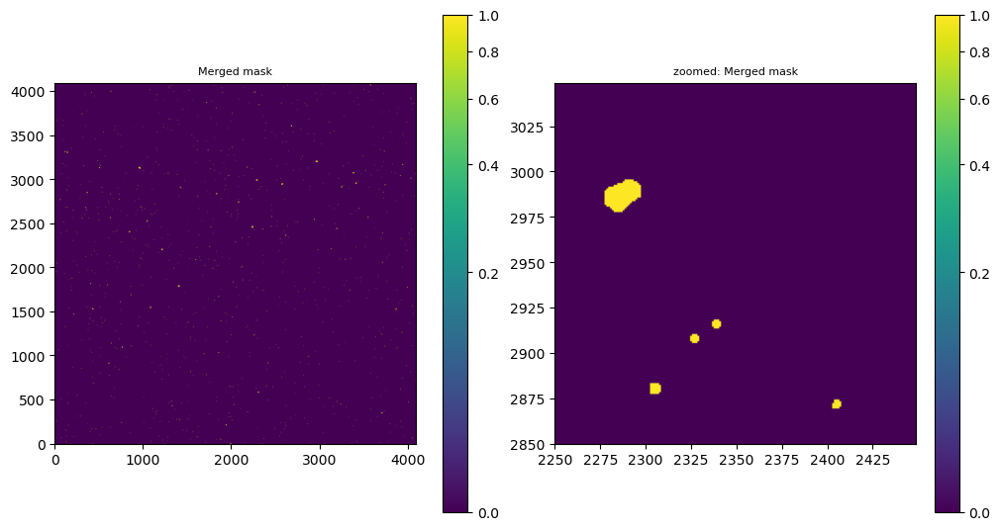

In [25]:
quick_plot_region(merged_mask, x_limits, y_limits, 'Merged mask', 0, 1, True)

In [26]:
# Save this master hole mask.

# construct a name
hole_mask_file = f'{flat_dir}/master_holemask_t33_4096x4096_2024_06.fits'
print(f'Will write master hold mask to {hole_mask_file}')
hdu = fits.PrimaryHDU(data=merged_mask)
hdulist = fits.HDUList([hdu])
hdulist[0].data = merged_mask
hdulist[0].header['IMAGETYP'] = ('HOLEMASK', 'Good pixels = 0, holes = 1')
hdulist[0].header['TELESCOP'] = ('iTelescope 33', 'Telescope name')
hdulist[0].header['COMMENT'] = 'Hole mask from gaussian image gradient thresholding and binary dilation'
hdulist[0].header['COMMENT'] = 'Combined hole mask using all T33 Master Flat files for 2024_06'
print( repr( hdulist[0].header ) )
hdulist.writeto(hole_mask_file, output_verify='silentfix', overwrite=True, checksum=True)

Will write master hold mask to /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06//master_holemask_t33_4096x4096_2024_06.fits
SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                   16 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 4096                                                  
NAXIS2  =                 4096                                                  
EXTEND  =                    T                                                  
IMAGETYP= 'HOLEMASK'           / Good pixels = 0, holes = 1                     
TELESCOP= 'iTelescope 33'      / Telescope name                                 
COMMENT Hole mask from gaussian image gradient thresholding and binary dilation 
COMMENT Combined hole mask using all T33 Master Flat files for 2024_06          


### Checking If We Have To Do Badpixel Correction To The Flats First!

Lots of small holes in the mask we made previously. We also know that the default iTelescope processing doesn't use a pad pixel correction that is as extensive as the one we've created, so maybe bad pixels are slipping into the master flats. It would be better to **not** have these end up as holes to be corrected because the hole filling affects a larger area than normal bad pixel correction.

In [27]:
default_badpix_path = '/old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Darks/2024_06/master_badpix_t33_202406_4096x4096_bin1.fits'
print(f'Enter the full path to the master badpix file associated with the image files chosen previously, or hit return to accept {default_badpix_path}')
badpix_file = input('Master badpix file path:').strip() or default_badpix_path
if pathlib.Path(badpix_file).exists():
    print(f'Using {badpix_file} as the Master Badpixel file')
else:
    print('Error, input Master Badpixel does not exist or cannot be accessed.')
    print('Check that the path you supplied is a valid filesystem path.')

Enter the full path to the master badpix file associated with the image files chosen previously, or hit return to accept /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Darks/2024_06/master_badpix_t33_202406_4096x4096_bin1.fits


Master badpix file path: 


Using /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Darks/2024_06/master_badpix_t33_202406_4096x4096_bin1.fits as the Master Badpixel file


Processing /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Blue_1_Blue_4096x4096_Bin1x1_Temp-15C_ExpTime4s.fit.gz


2025-03-15 15:20:03,604 | ApFixBadPixels | INFO | fix_bad_pixels: data has 4096 rows x 4096 columns, dtype=>f4
2025-03-15 15:20:03,605 | ApFixBadPixels | INFO | fix_bad_pixels: mask has 4096 rows x 4096 columns, dtype=uint8
2025-03-15 15:20:17,765 | ApFixBadPixels | INFO | Processed 1147455 pixels in 14.135 s, 0.012 ms per bad pixel.
2025-03-15 15:20:17,769 | ApFixBadPixels | WARNING | Could not fix 183414 pixels as they had less than 4 good neighbors when deltapix=2 pixels.


  Image median value is 25817.5703125
Normalized flat_data data min=0.07, max=1.34, mean=1.01 +/- 0.09, median=1.00 ADU.
  90% of data between 0.89 and 1.16 ADU (5-95 precentiles)
  98% of data between 0.74 and 1.17 ADU (1-99 precentiles)
flat_data gradient data min=0.00, max=0.56, mean=0.00 +/- 0.00, median=0.00 ADU.
  90% of data between 0.00 and 0.01 ADU (5-95 precentiles)
  98% of data between 0.00 and 0.01 ADU (1-99 precentiles)
  Gradient threshold = 0.025559 ADU
  Total number of pixels in mask: 18845
Input data 0.5th percentile = 0.0000, 99.5th percentile = 0.0000
Applying asinh stretch between 0.0000 and 1.0000
Processing /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Green_1_Green_4096x4096_Bin1x1_Temp-15C_ExpTime5s.fit.gz


2025-03-15 15:20:20,249 | ApFixBadPixels | INFO | fix_bad_pixels: data has 4096 rows x 4096 columns, dtype=>f4
2025-03-15 15:20:20,249 | ApFixBadPixels | INFO | fix_bad_pixels: mask has 4096 rows x 4096 columns, dtype=uint8
2025-03-15 15:20:34,315 | ApFixBadPixels | INFO | Processed 1147455 pixels in 14.051 s, 0.012 ms per bad pixel.
2025-03-15 15:20:34,319 | ApFixBadPixels | WARNING | Could not fix 183414 pixels as they had less than 4 good neighbors when deltapix=2 pixels.


  Image median value is 25869.5234375
Normalized flat_data data min=0.07, max=1.34, mean=1.01 +/- 0.09, median=1.00 ADU.
  90% of data between 0.89 and 1.16 ADU (5-95 precentiles)
  98% of data between 0.73 and 1.18 ADU (1-99 precentiles)
flat_data gradient data min=0.00, max=0.55, mean=0.00 +/- 0.00, median=0.00 ADU.
  90% of data between 0.00 and 0.00 ADU (5-95 precentiles)
  98% of data between 0.00 and 0.01 ADU (1-99 precentiles)
  Gradient threshold = 0.023953 ADU
  Total number of pixels in mask: 18920
Input data 0.5th percentile = 0.0000, 99.5th percentile = 0.0000
Applying asinh stretch between 0.0000 and 1.0000
Processing /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Ha_1_Ha_4096x4096_Bin1x1_Temp-15C_ExpTime20s.fit.gz


2025-03-15 15:20:36,766 | ApFixBadPixels | INFO | fix_bad_pixels: data has 4096 rows x 4096 columns, dtype=>f4
2025-03-15 15:20:36,767 | ApFixBadPixels | INFO | fix_bad_pixels: mask has 4096 rows x 4096 columns, dtype=uint8
2025-03-15 15:20:50,929 | ApFixBadPixels | INFO | Processed 1147455 pixels in 14.146 s, 0.012 ms per bad pixel.
2025-03-15 15:20:50,932 | ApFixBadPixels | WARNING | Could not fix 183414 pixels as they had less than 4 good neighbors when deltapix=2 pixels.


  Image median value is 23554.439453125
Normalized flat_data data min=0.07, max=2.20, mean=1.00 +/- 0.09, median=1.00 ADU.
  90% of data between 0.90 and 1.15 ADU (5-95 precentiles)
  98% of data between 0.67 and 1.16 ADU (1-99 precentiles)
flat_data gradient data min=0.00, max=0.48, mean=0.00 +/- 0.00, median=0.00 ADU.
  90% of data between 0.00 and 0.00 ADU (5-95 precentiles)
  98% of data between 0.00 and 0.00 ADU (1-99 precentiles)
  Gradient threshold = 0.021161 ADU
  Total number of pixels in mask: 17947
Input data 0.5th percentile = 0.0000, 99.5th percentile = 0.0000
Applying asinh stretch between 0.0000 and 1.0000
Processing /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Luminance_1_Luminance_4096x4096_Bin1x1_Temp-15C_ExpTime3s.fit.gz


2025-03-15 15:20:53,316 | ApFixBadPixels | INFO | fix_bad_pixels: data has 4096 rows x 4096 columns, dtype=>f4
2025-03-15 15:20:53,316 | ApFixBadPixels | INFO | fix_bad_pixels: mask has 4096 rows x 4096 columns, dtype=uint8
2025-03-15 15:21:07,412 | ApFixBadPixels | INFO | Processed 1147455 pixels in 14.080 s, 0.012 ms per bad pixel.
2025-03-15 15:21:07,416 | ApFixBadPixels | WARNING | Could not fix 183414 pixels as they had less than 4 good neighbors when deltapix=2 pixels.


  Image median value is 24331.00390625
Normalized flat_data data min=0.06, max=1.29, mean=0.96 +/- 0.14, median=1.00 ADU.
  90% of data between 0.70 and 1.13 ADU (5-95 precentiles)
  98% of data between 0.64 and 1.15 ADU (1-99 precentiles)
flat_data gradient data min=0.00, max=0.52, mean=0.00 +/- 0.00, median=0.00 ADU.
  90% of data between 0.00 and 0.00 ADU (5-95 precentiles)
  98% of data between 0.00 and 0.00 ADU (1-99 precentiles)
  Gradient threshold = 0.022162 ADU
  Total number of pixels in mask: 18749
Input data 0.5th percentile = 0.0000, 99.5th percentile = 0.0000
Applying asinh stretch between 0.0000 and 1.0000
Processing /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_OIII_1_OIII_4096x4096_Bin1x1_Temp-15C_ExpTime17s.fit.gz


2025-03-15 15:21:09,790 | ApFixBadPixels | INFO | fix_bad_pixels: data has 4096 rows x 4096 columns, dtype=>f4
2025-03-15 15:21:09,791 | ApFixBadPixels | INFO | fix_bad_pixels: mask has 4096 rows x 4096 columns, dtype=uint8
2025-03-15 15:21:23,944 | ApFixBadPixels | INFO | Processed 1147455 pixels in 14.138 s, 0.012 ms per bad pixel.
2025-03-15 15:21:23,948 | ApFixBadPixels | WARNING | Could not fix 183414 pixels as they had less than 4 good neighbors when deltapix=2 pixels.


  Image median value is 23306.09375
Normalized flat_data data min=0.07, max=2.05, mean=1.01 +/- 0.10, median=1.00 ADU.
  90% of data between 0.89 and 1.15 ADU (5-95 precentiles)
  98% of data between 0.67 and 1.17 ADU (1-99 precentiles)
flat_data gradient data min=0.00, max=0.55, mean=0.00 +/- 0.00, median=0.00 ADU.
  90% of data between 0.00 and 0.00 ADU (5-95 precentiles)
  98% of data between 0.00 and 0.01 ADU (1-99 precentiles)
  Gradient threshold = 0.024637 ADU
  Total number of pixels in mask: 19300
Input data 0.5th percentile = 0.0000, 99.5th percentile = 0.0000
Applying asinh stretch between 0.0000 and 1.0000
Processing /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Red_1_Red_4096x4096_Bin1x1_Temp-15C_ExpTime4s.fit.gz


2025-03-15 15:21:26,311 | ApFixBadPixels | INFO | fix_bad_pixels: data has 4096 rows x 4096 columns, dtype=>f4
2025-03-15 15:21:26,311 | ApFixBadPixels | INFO | fix_bad_pixels: mask has 4096 rows x 4096 columns, dtype=uint8
2025-03-15 15:21:40,347 | ApFixBadPixels | INFO | Processed 1147455 pixels in 14.020 s, 0.012 ms per bad pixel.
2025-03-15 15:21:40,350 | ApFixBadPixels | WARNING | Could not fix 183414 pixels as they had less than 4 good neighbors when deltapix=2 pixels.


  Image median value is 23407.939453125
Normalized flat_data data min=0.07, max=1.32, mean=1.01 +/- 0.09, median=1.00 ADU.
  90% of data between 0.89 and 1.16 ADU (5-95 precentiles)
  98% of data between 0.73 and 1.18 ADU (1-99 precentiles)
flat_data gradient data min=0.00, max=0.49, mean=0.00 +/- 0.00, median=0.00 ADU.
  90% of data between 0.00 and 0.00 ADU (5-95 precentiles)
  98% of data between 0.00 and 0.00 ADU (1-99 precentiles)
  Gradient threshold = 0.021290 ADU
  Total number of pixels in mask: 18646
Input data 0.5th percentile = 0.0000, 99.5th percentile = 0.0000
Applying asinh stretch between 0.0000 and 1.0000
Processing /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_SII_1_SII_4096x4096_Bin1x1_Temp-15C_ExpTime27s.fit.gz


2025-03-15 15:21:42,746 | ApFixBadPixels | INFO | fix_bad_pixels: data has 4096 rows x 4096 columns, dtype=>f4
2025-03-15 15:21:42,746 | ApFixBadPixels | INFO | fix_bad_pixels: mask has 4096 rows x 4096 columns, dtype=uint8
2025-03-15 15:21:57,064 | ApFixBadPixels | INFO | Processed 1147455 pixels in 14.302 s, 0.012 ms per bad pixel.
2025-03-15 15:21:57,068 | ApFixBadPixels | WARNING | Could not fix 183414 pixels as they had less than 4 good neighbors when deltapix=2 pixels.


  Image median value is 23724.2265625
Normalized flat_data data min=0.07, max=2.54, mean=1.01 +/- 0.09, median=1.00 ADU.
  90% of data between 0.90 and 1.16 ADU (5-95 precentiles)
  98% of data between 0.67 and 1.17 ADU (1-99 precentiles)
flat_data gradient data min=0.00, max=0.57, mean=0.00 +/- 0.00, median=0.00 ADU.
  90% of data between 0.00 and 0.00 ADU (5-95 precentiles)
  98% of data between 0.00 and 0.00 ADU (1-99 precentiles)
  Gradient threshold = 0.020739 ADU
  Total number of pixels in mask: 17984
Input data 0.5th percentile = 0.0000, 99.5th percentile = 0.0000
Applying asinh stretch between 0.0000 and 1.0000


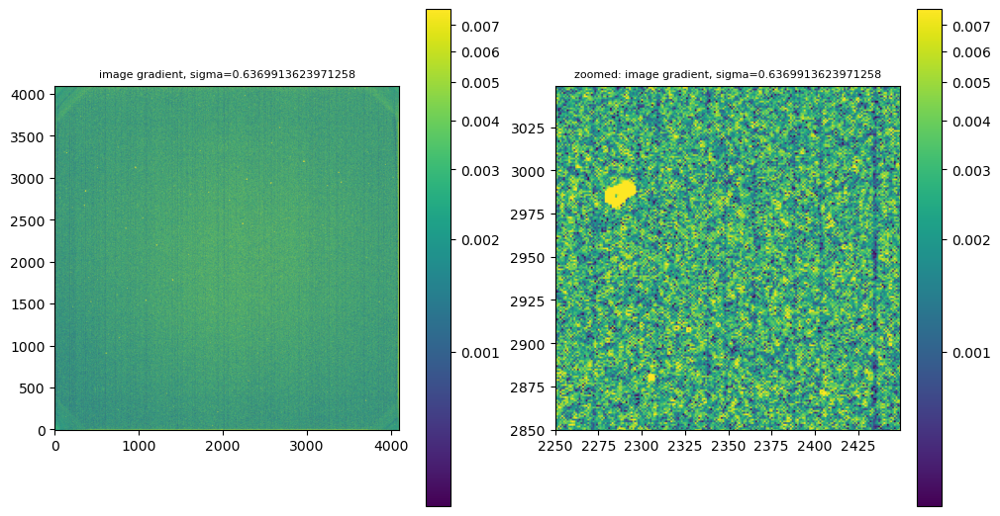

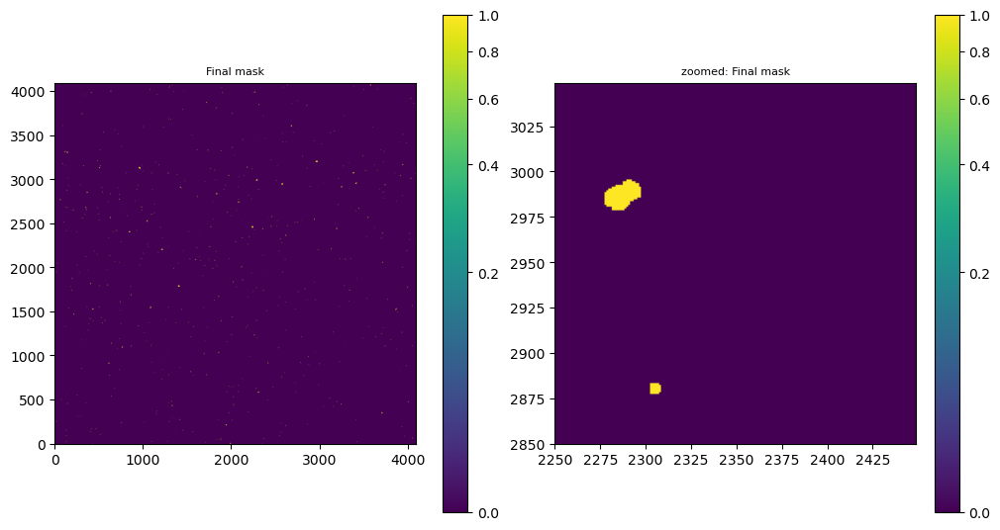

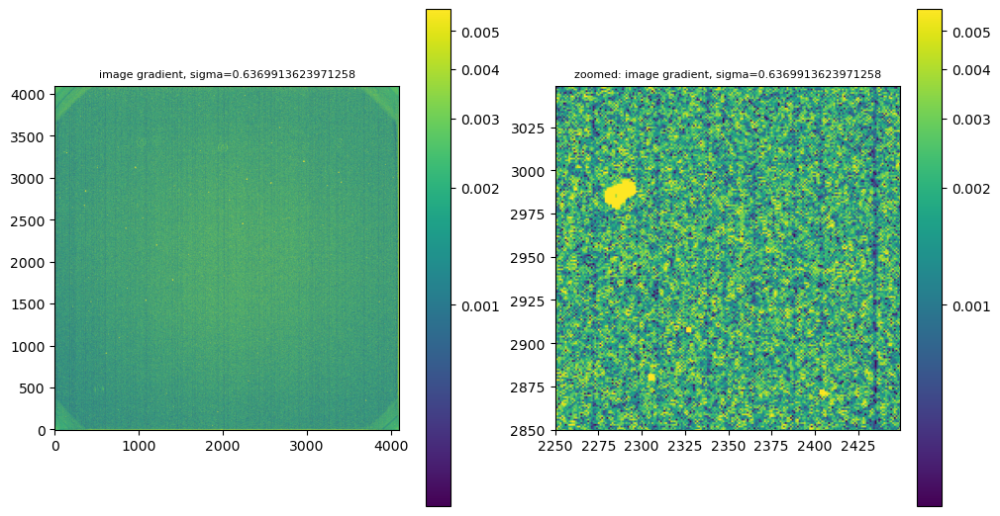

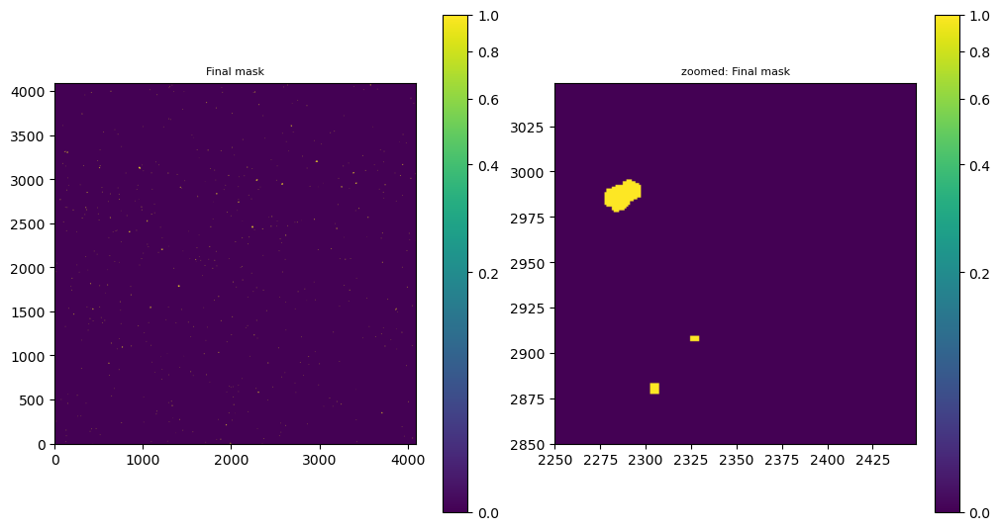

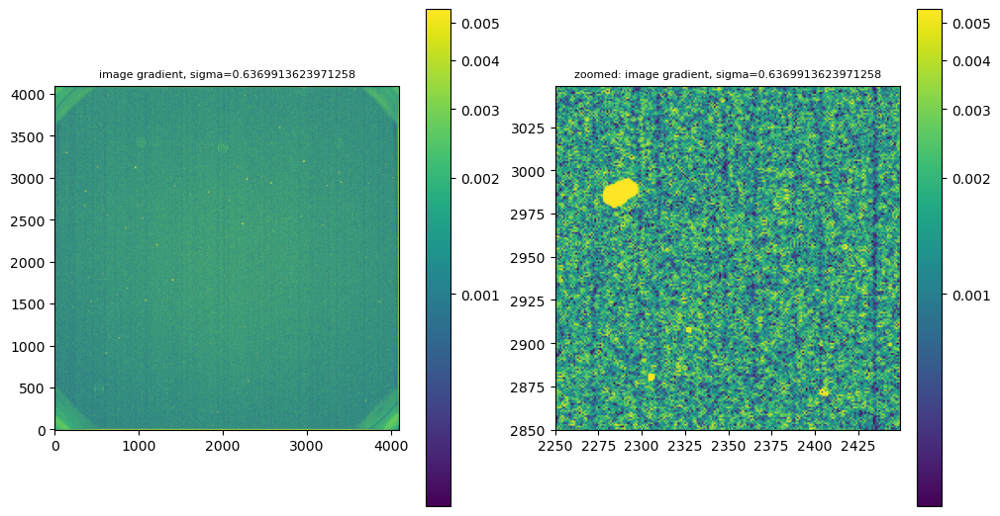

...

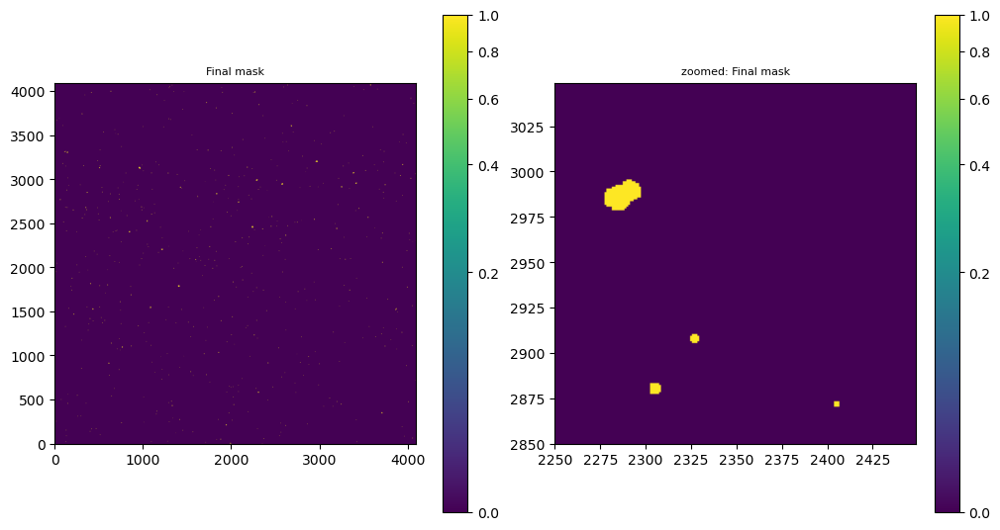

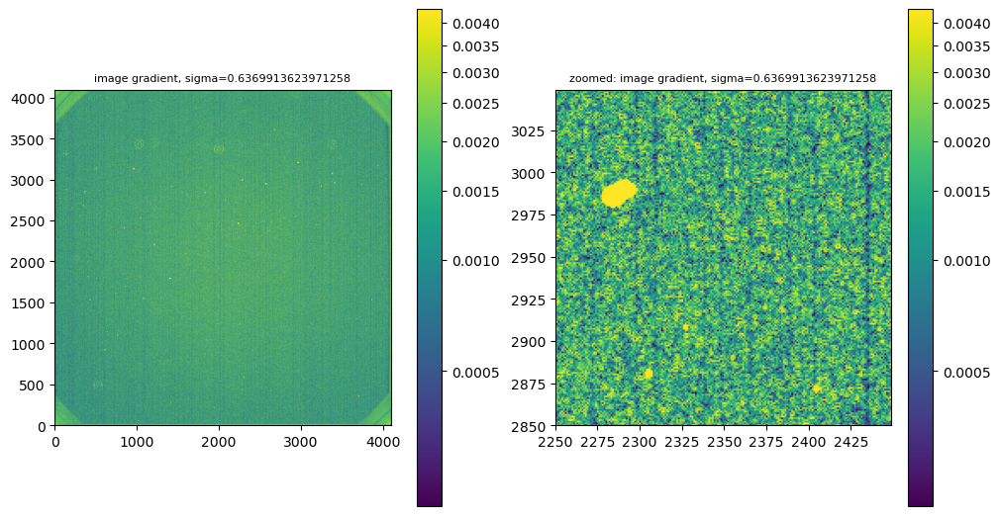

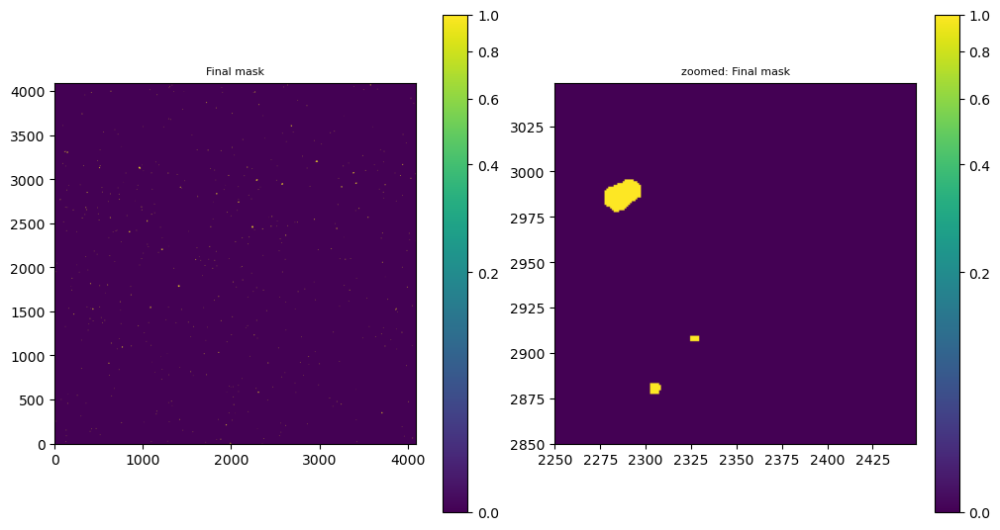

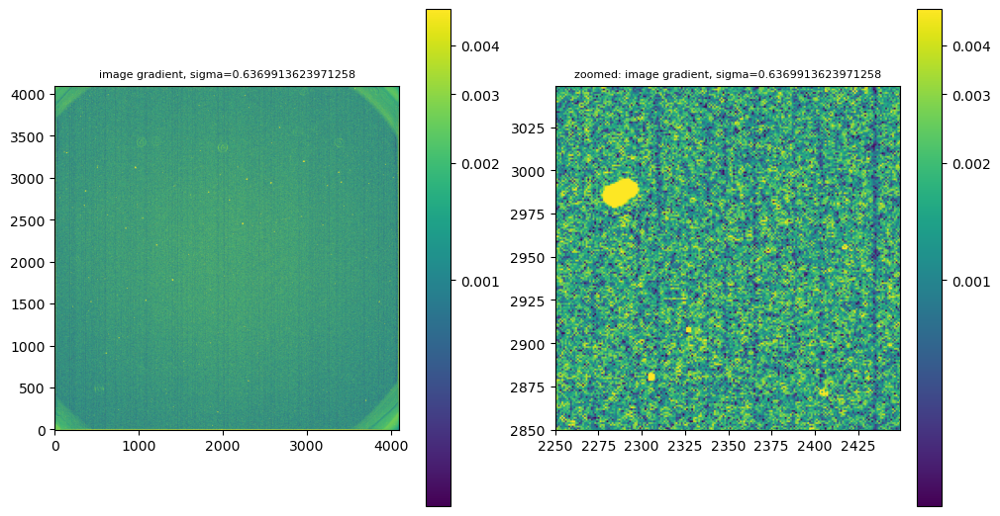

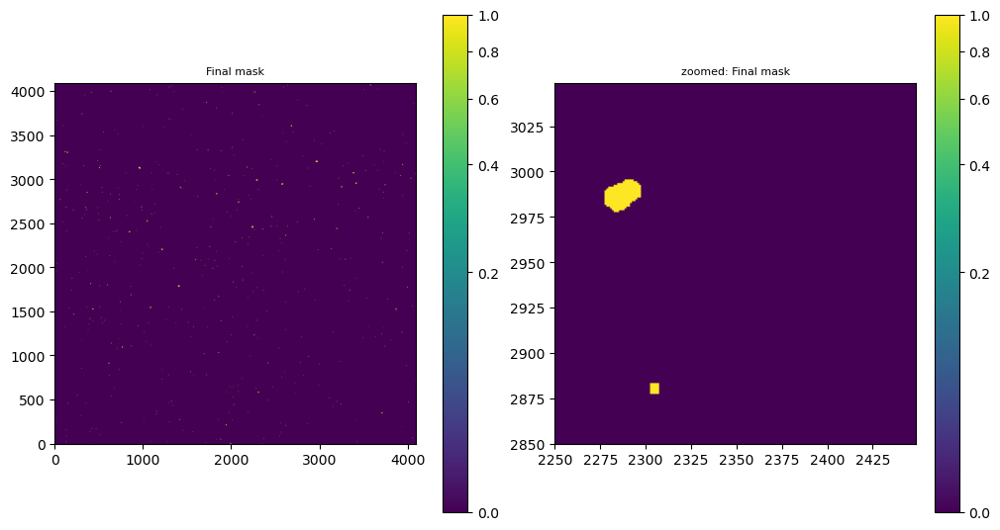

In [28]:
alt_fdata_list = []
alt_fmask_list = []
for fpath in flist:
    (a_data, a_mask) = make_norm_flat_and_mask(fpath, True, badpix_file, 2)
    alt_fdata_list.append( a_data )
    alt_fmask_list.append( a_mask )

In [29]:
bp_merged_mask = None
for a_mask in alt_fmask_list:
    # combine masks
    if bp_merged_mask is None:
        bp_merged_mask = a_mask.copy()
    else:
        bp_merged_mask = np.logical_or(bp_merged_mask, a_mask).astype(np.int16)

    nbad = np.sum(bp_merged_mask)
    print(f'Number of bad pixels associated with holes: {nbad}')

Number of bad pixels associated with holes: 18845
Number of bad pixels associated with holes: 19256
Number of bad pixels associated with holes: 19949
Number of bad pixels associated with holes: 20233
Number of bad pixels associated with holes: 20480
Number of bad pixels associated with holes: 20521
Number of bad pixels associated with holes: 20646


Input data 0.5th percentile = 0.0000, 99.5th percentile = 0.0000
Applying asinh stretch between 0.0000 and 1.0000


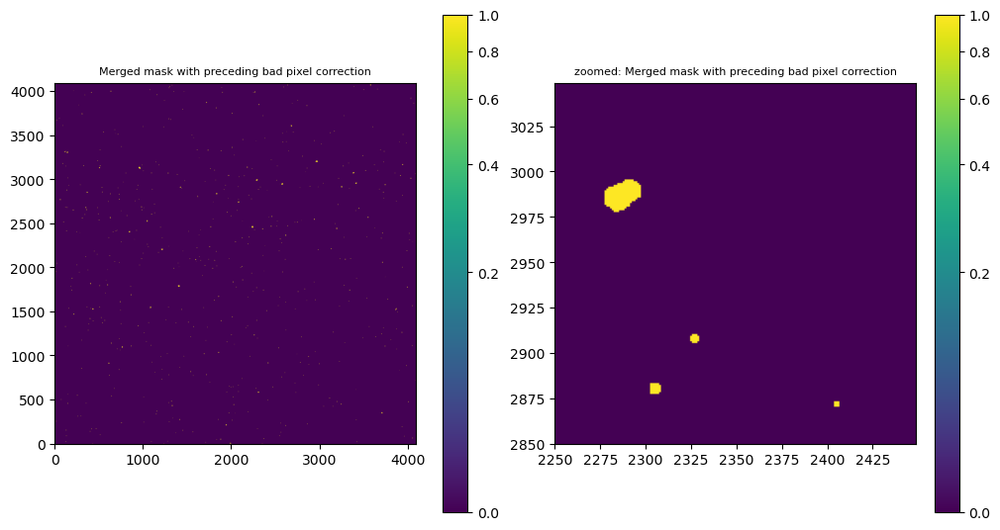

In [30]:
quick_plot_region(bp_merged_mask, x_limits, y_limits, 'Merged mask with preceding bad pixel correction', 0, 1, True)

In [31]:
# Save this master hole mask.

# construct a name
hole_mask_file = f'{flat_dir}/master_holemask_t33_4096x4096_2024_06_badpixcorr.fits'
print(f'Will write master hole mask to {hole_mask_file}')
hdu = fits.PrimaryHDU(data=bp_merged_mask)
hdulist = fits.HDUList([hdu])
hdulist[0].header['IMAGETYP'] = ('HOLEMASK', 'Good pixels = 0, holes = 1')
hdulist[0].header['TELESCOP'] = ('iTelescope 33', 'Telescope name')
hdulist[0].header['COMMENT'] = 'Hole mask from gaussian image gradient thresholding and binary dilation'
hdulist[0].header['COMMENT'] = 'Combined hole mask using all T33 Master Flat files for 2024_06'
hdulist[0].header['COMMENT'] = 'Bad pixel correction was applied to flats before gradient thresholding'
print( repr( hdulist[0].header ) )
hdulist.writeto(hole_mask_file, output_verify='silentfix', overwrite=True, checksum=True)

Will write master hole mask to /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06//master_holemask_t33_4096x4096_2024_06_badpixcorr.fits
SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                   16 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 4096                                                  
NAXIS2  =                 4096                                                  
EXTEND  =                    T                                                  
IMAGETYP= 'HOLEMASK'           / Good pixels = 0, holes = 1                     
TELESCOP= 'iTelescope 33'      / Telescope name                                 
COMMENT Hole mask from gaussian image gradient thresholding and binary dilation 
COMMENT Combined hole mask using all T33 Master Flat files for 2024_06          
COMMENT Bad 

**Summary**: It appears that bad-pixel correcting the master flats does remove a significant number of the smaller artifacts that we would process as holes.

## Biharmonic Inpainting

In [32]:

def inpaint_biharmonic_wrapper(image, mask):
    """
    Wrapper around skimage.restoration.inpaint_biharmonic that handles the
    rescaling to and from [0,1] range it uses
    """

    # input image has range minval to maxval, so to scale to [0,1] range
    # we do 
    # scaled = (image - minval)/(maxval-minval)
    # 
    # to restore the fixed_scaled we do
    # fixed = (maxval-minval) * fixed_scaled + minval

    minval = np.min(image)
    maxval = np.max(image)
    delta = maxval - minval
    print(f'Input image has minimum={minval:f}, maximum={maxval:f}, range={delta:f} counts per pixel.')

    scaled = (image.astype(float) - minval)/ delta
    chk_minval = np.min(scaled)
    chk_maxval = np.max(scaled)
    print(f'Rescaled image has minimum={chk_minval:f}, maximum={chk_maxval:f}, range={chk_maxval-chk_minval:f} counts per pixel.')
    
    fixed_scaled = restoration.inpaint_biharmonic(scaled, mask)

    fixed = (fixed_scaled*delta) + minval
    chk_minval = np.min(fixed)
    chk_maxval = np.max(fixed)    
    print(f'Restored image has minimum={chk_minval:f}, maximum={chk_maxval:f}, range={chk_maxval-chk_minval:f} counts per pixel.')
    return fixed


Input image has minimum=0.065139, maximum=2.631588, range=2.566449 counts per pixel.
Rescaled image has minimum=0.000000, maximum=1.000000, range=1.000000 counts per pixel.
Restored image has minimum=0.237215, maximum=1.223798, range=0.986584 counts per pixel.


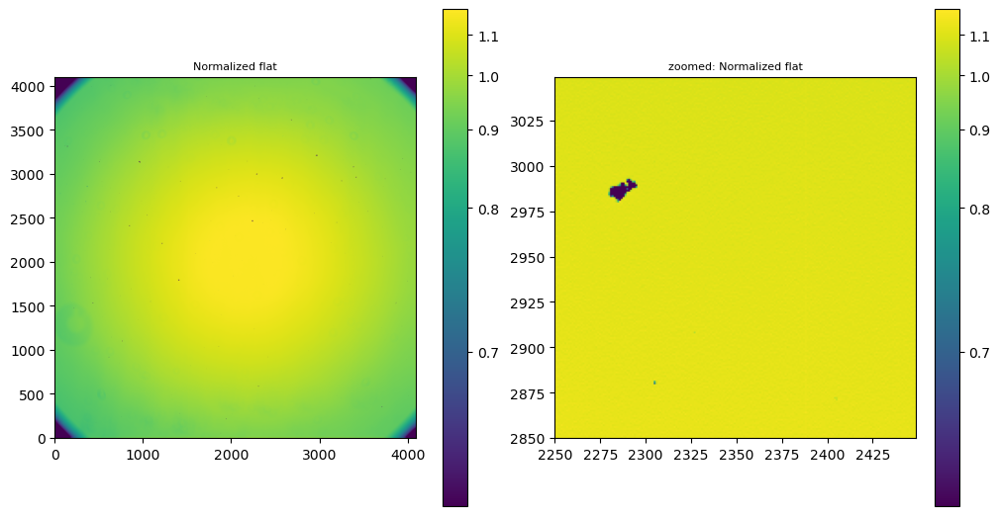

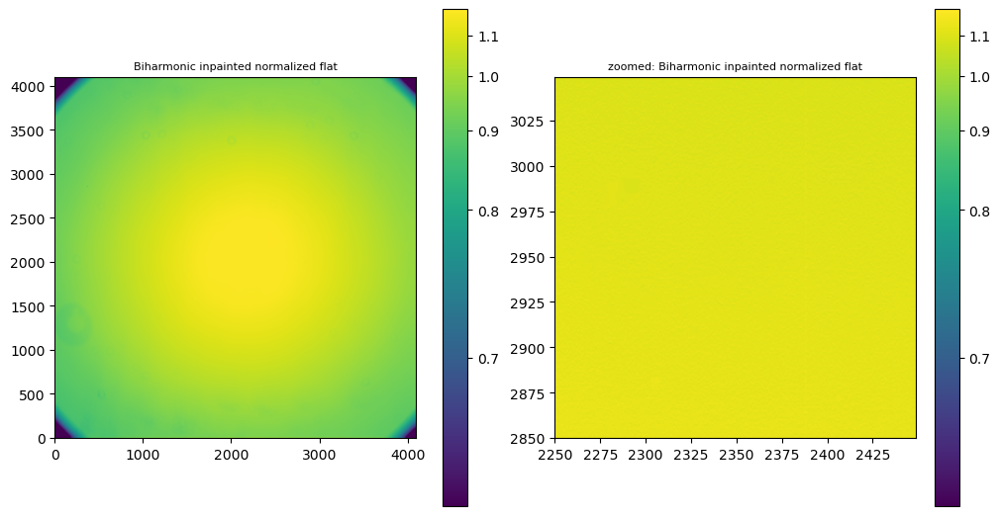

In [33]:
fixed_norm_flat = inpaint_biharmonic_wrapper(norm_flat_data, dilated)
quick_plot_region(norm_flat_data, x_limits, y_limits, 'Normalized flat')
quick_plot_region(fixed_norm_flat, x_limits, y_limits, 'Biharmonic inpainted normalized flat')

fixed flat differences data min=-1.69, max=1.11, mean=0.00 +/- 0.01, median=0.00 ADU.
  90% of data between -0.00 and 0.00 ADU (5-95 precentiles)
  98% of data between -0.00 and 0.00 ADU (1-99 precentiles)


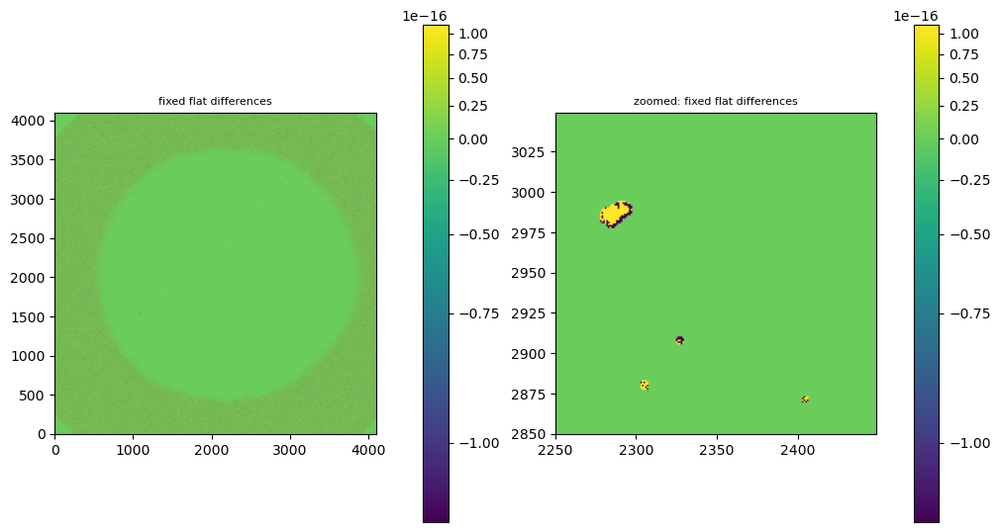

In [34]:
# Look at differences
flat_diff = fixed_norm_flat - norm_flat_data
[fx_minval, fx_maxval, fx_meanval, fx_stdval, fx_medval] = ap.util.img_stats(flat_diff, 'fixed flat differences', True)
quick_plot_region(flat_diff, x_limits, y_limits, 'fixed flat differences')

fixed_flat_data gradient data min=0.00, max=0.02, mean=0.00 +/- 0.00, median=0.00 ADU.
  90% of data between 0.00 and 0.01 ADU (5-95 precentiles)
  98% of data between 0.00 and 0.01 ADU (1-99 precentiles)


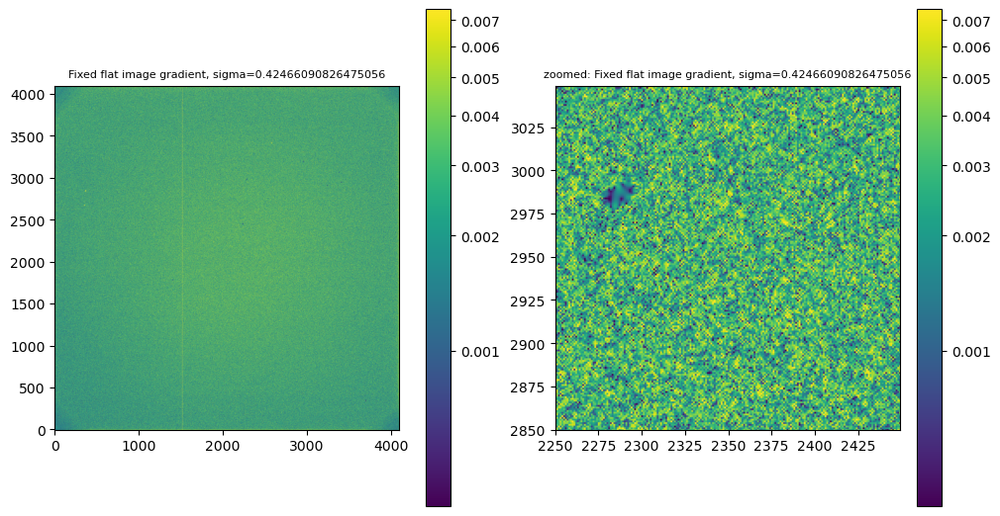

In [35]:
fixed_flat_data_gradient = ndimage.gaussian_gradient_magnitude(fixed_norm_flat, sigma=sigma_pix)
[fx_minval, fx_maxval, fx_meanval, fx_stdval, fx_medval] = ap.util.img_stats(fixed_flat_data_gradient, 'fixed_flat_data gradient', True)
quick_plot_region(fixed_flat_data_gradient, x_limits, y_limits, f'Fixed flat image gradient, sigma={sigma_pix}')

---

But how well does the biharmonic infilling work on an actual image?

Using /old_lnx/home/dks/Downloads/iTelescopeScratch/calibration-library/T33/Masters/Flats/2024_06/Master_Flat_Blue_1_Blue_4096x4096_Bin1x1_Temp-15C_ExpTime4s.fit.gz
Input image has minimum=1681.756836, maximum=67941.937500, range=66260.179688 counts per pixel.
Rescaled image has minimum=0.000000, maximum=1.000000, range=1.000000 counts per pixel.
Restored image has minimum=6124.367676, maximum=31595.826172, range=25471.458496 counts per pixel.
difference image data min=-43591.93, max=28706.15, mean=2.63 +/- 226.13, median=0.00 ADU.
  90% of data between 0.00 and 0.00 ADU (5-95 precentiles)
  98% of data between 0.00 and 0.00 ADU (1-99 precentiles)


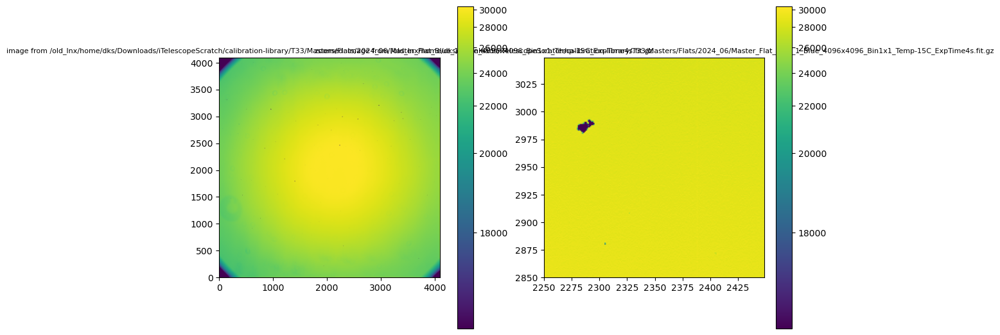

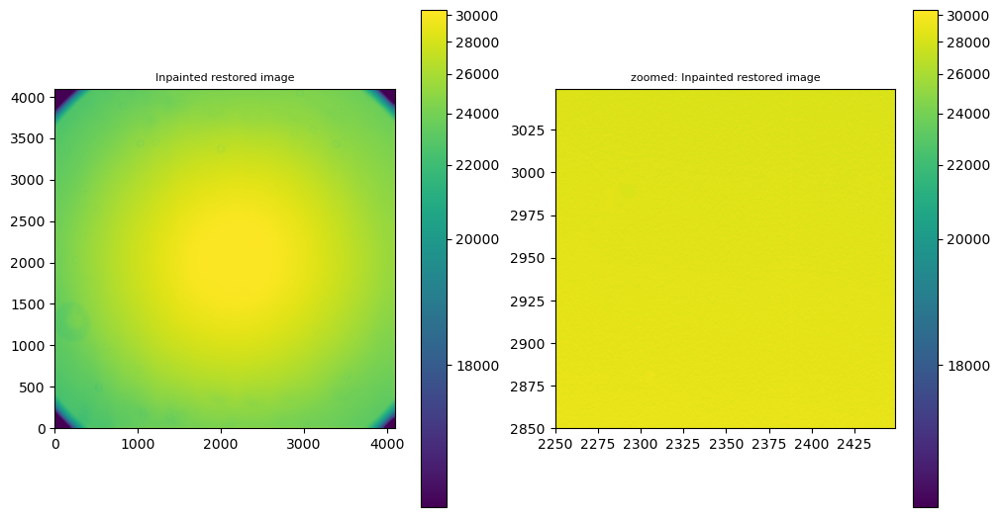

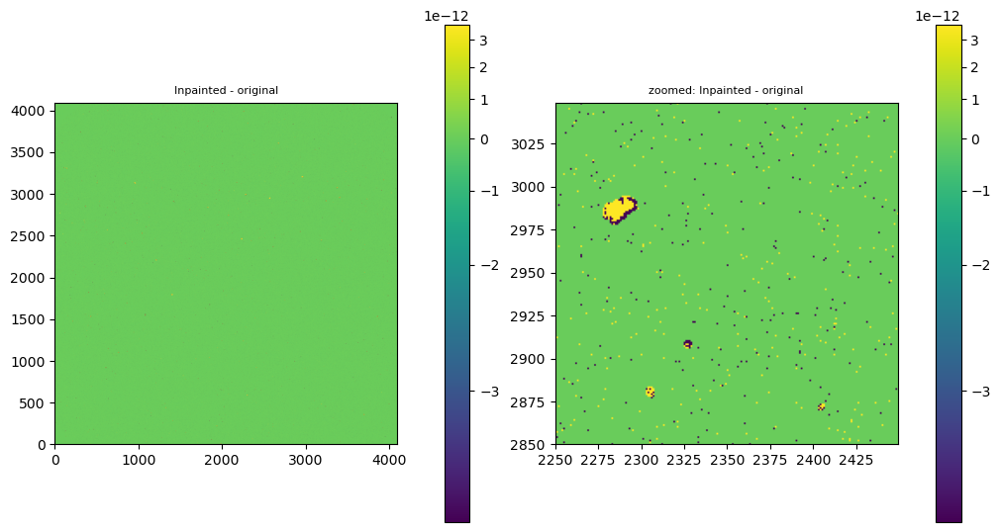

In [36]:
data_file = str(imlist[-1])
print(f'Using {data_file}')
with fits.open(data_file) as hdulist:
    imdata = hdulist[0].data
    quick_plot_region(imdata, x_limits, y_limits, f'image from {data_file}')

    fixed_imdata = inpaint_biharmonic_wrapper(imdata, dilated)
    diff_img = fixed_imdata - imdata
    [df_minval, df_maxval, df_meanval, df_stdval, dff_medval] = ap.util.img_stats(diff_img, 'difference image', True)
    
    quick_plot_region(fixed_imdata, x_limits, y_limits, 'Inpainted restored image')

    quick_plot_region(diff_img, x_limits, y_limits, 'Inpainted - original')

# Inpainting experiments

The biharmonic inpainting worked well on the general smooth, high S/N, flats. It did not do well on the actual data. Let's explore some aspects of this.

1. Does the shape of the region being in-painted matter?
2. How does decreasing signal-to-noise affect the result?
3. Web-search: are there inpainting techniques for low S/N cases?

Average count rate = 25.53 +/- 5.21 counts/pixel, S/N=4.90
Input image has minimum=8.000000, maximum=47.000000, range=39.000000 counts per pixel.
Rescaled image has minimum=0.000000, maximum=1.000000, range=1.000000 counts per pixel.
Restored image has minimum=8.000000, maximum=47.000000, range=39.000000 counts per pixel.
Fixed count image for S/N=4.90 data min=8.00, max=47.00, mean=25.56 +/- 5.17, median=25.00 ADU.
  90% of data between 17.48 and 34.00 ADU (5-95 precentiles)
  98% of data between 14.00 and 38.00 ADU (1-99 precentiles)
difference image for S/N=4.90 data min=-17.51, max=18.27, mean=0.03 +/- 1.56, median=0.00 ADU.
  90% of data between 0.00 and 0.00 ADU (5-95 precentiles)
  98% of data between -5.80 and 6.95 ADU (1-99 precentiles)


Text(0.5, 1.0, 'Rate image')

Text(0.5, 1.0, 'Counts image with Poisson noise')

Text(0.5, 1.0, 'Mask')

Text(0.5, 1.0, 'Approximate S/N = 4.90')

Text(0.5, 1.0, 'Inpainted image')

Text(0.5, 1.0, 'Inpainted minus orignal')

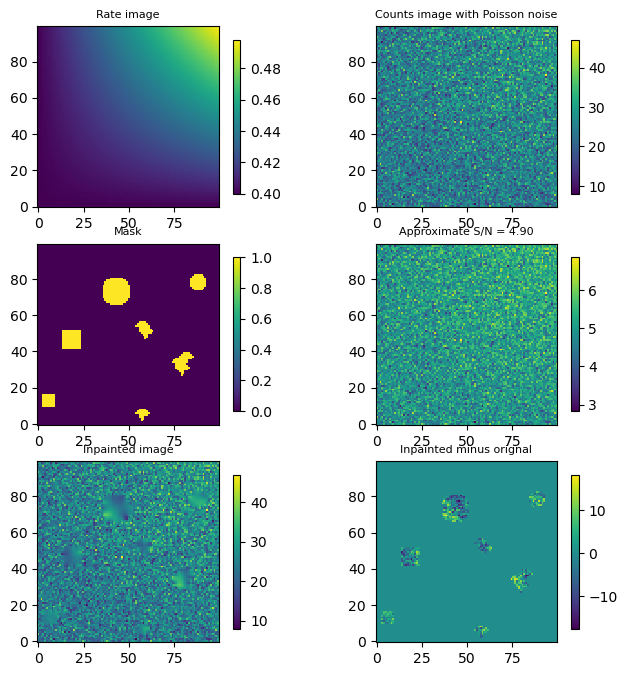

In [37]:
def make_rate_image(nrows, ncols):
    rate_img = np.zeros((nrows, ncols), dtype=float)

    # flat background
    rate_img += 0.4

    row_gradient = 0.005
    col_gradiant = 0.002
    slope_bg = np.ones((nrows, ncols), dtype=float)
    for ir in range(nrows):
        slope_bg[ir, :] = ir * row_gradient
        for ic in range(ncols):
            slope_bg[ir, ic] *= ic * col_gradiant

    rate_img += slope_bg
    return rate_img


def make_fake_image(nrows, ncols, exposure_time_secs):
    img = exposure_time_secs * make_rate_image(ncols, nrows)
    return photutils.datasets.apply_poisson_noise(img)


def make_fake_mask(img_to_mask):
    """
    Create a mask image with regions to inpaint set to 1, and
    all other pixel set to zero.
    """
    msk = np.zeros(img_to_mask.shape, dtype=int)

    # squares
    msk[10:17, 3:10] = 1
    msk[42:52, 14:24] = 1

    # Circles, (rcen, ccen, rad)
    circles = [(78, 88, 5), (73, 43, 8)]
    for circ in circles:
        for ridx in range(msk.shape[0]):
            rdist = ridx - circ[0]
            for cidx in range(msk.shape[1]):
                cdist = cidx - circ[1]
                radius = math.sqrt(rdist * rdist + cdist * cdist)
                if radius < circ[2]:
                    msk[ridx, cidx] = 1

    # irregular shapes (row, col)
    pixels = [
        (30, 77),
        (31, 77),
        (31, 78),
        (32, 76),
        (32, 77),
        (32, 78),
        (33, 76),
        (33, 77),
        (33, 78),
        (33, 79),
        (33, 80),
        (34, 74),
        (34, 75),
        (34, 76), (34, 77), (34, 78),
        (34, 79),
        (34, 80),
        (34, 81),
        (35, 75), (35, 76), (35, 77), (35, 78), (35, 79), (35, 80),
        (36, 76), (36, 77), (36, 78), (36, 79),
    ]
    for pix in pixels:
        # big blob
        msk[pix[0], pix[1]] = 1
        msk[pix[0]-3, pix[1]+2] = 1
        msk[pix[0]+3, pix[1]+4] = 1

        # smaller blob
        msk[pix[0]+20, pix[1]-20] = 1
        msk[pix[0]-3+20, pix[1]+2-20] = 1

        # small blob near edge
        msk[pix[0]-28, pix[1]-20] = 1
    return msk



do_test = True
rimg = None
cimg = None
mimg = None
snimg = None
fixed_cimg = None
diff_img = None
if do_test:
    texp = 60
    rimg = make_rate_image(100, 100)
    cimg = make_fake_image(100, 100, texp)
    mimg = make_fake_mask(cimg)
    snimg = np.sqrt(cimg)
    meanval = np.mean(cimg)
    stdval = np.std(cimg)
    snratio = meanval / stdval
    print(
        f"Average count rate = {meanval:.2f} +/- {stdval:.2f} counts/pixel, S/N={snratio:.2f}"
    )

    fixed_cimg = inpaint_biharmonic_wrapper(cimg, mimg)
    [fx_minval, fx_maxval, fx_meanval, fx_stdval, fx_medval] = ap.util.img_stats(fixed_cimg, f'Fixed count image for S/N={snratio:.2f}', True)
    
    diff_img = fixed_cimg - cimg
    [df_minval, df_maxval, df_meanval, df_stdval, df_medval] = ap.util.img_stats(diff_img, f'difference image for S/N={snratio:.2f}', True)
    
    fig, axarr = plt.subplots(3, 2, figsize=(8, 8))
    ax1 = axarr[0][0]
    ax2 = axarr[0][1]
    ax3 = axarr[1][0]
    ax4 = axarr[1][1]
    ax5 = axarr[2][0]
    ax6 = axarr[2][1]

    im = ax1.imshow(rimg, origin="lower", interpolation="nearest")
    ax1.set_title("Rate image", fontsize=8)
    cbar1 = fig.colorbar(
        im,
        ax=ax1,
        extend="neither",
        spacing="proportional",
        orientation="vertical",
        shrink=0.85,
    )

    im = ax2.imshow(cimg, origin="lower", interpolation="nearest")
    ax2.set_title("Counts image with Poisson noise", fontsize=8)
    cbar2 = fig.colorbar(
        im,
        ax=ax2,
        extend="neither",
        spacing="proportional",
        orientation="vertical",
        shrink=0.85,
    )

    im = ax3.imshow(mimg, origin="lower", interpolation="nearest")
    ax3.set_title("Mask", fontsize=8)
    cbar3 = fig.colorbar(
        im,
        ax=ax3,
        extend="neither",
        spacing="proportional",
        orientation="vertical",
        shrink=0.85,
    )

    im = ax4.imshow(snimg, origin="lower", interpolation="nearest")
    ax4.set_title(f"Approximate S/N = {snratio:.2f}", fontsize=8)
    cbar4 = fig.colorbar(
        im,
        ax=ax4,
        extend="neither",
        spacing="proportional",
        orientation="vertical",
        shrink=0.85,
    )

    im = ax5.imshow(fixed_cimg, origin="lower", interpolation="nearest")
    ax5.set_title("Inpainted image", fontsize=8)
    cbar5 = fig.colorbar(
        im,
        ax=ax5,
        extend="neither",
        spacing="proportional",
        orientation="vertical",
        shrink=0.85,
    )

    im = ax6.imshow(diff_img, origin="lower", interpolation="nearest")
    ax6.set_title("Inpainted minus orignal", fontsize=8)
    cbar6 = fig.colorbar(
        im,
        ax=ax6,
        extend="neither",
        spacing="proportional",
        orientation="vertical",
        shrink=0.85,
    )

So it seems to do well when the local range is well captured by the total image, but not when the full image range is large?

# Image Segmentation and Inpainting with ApFixHoles

The following demonstrates scikit image segmentation functionality. The following assumes the mask has been prepared with some form of connection element to clean up the boundary of the regions and suppress "small" features.

## Simplified Test Case

In [38]:
import skimage.measure as skm

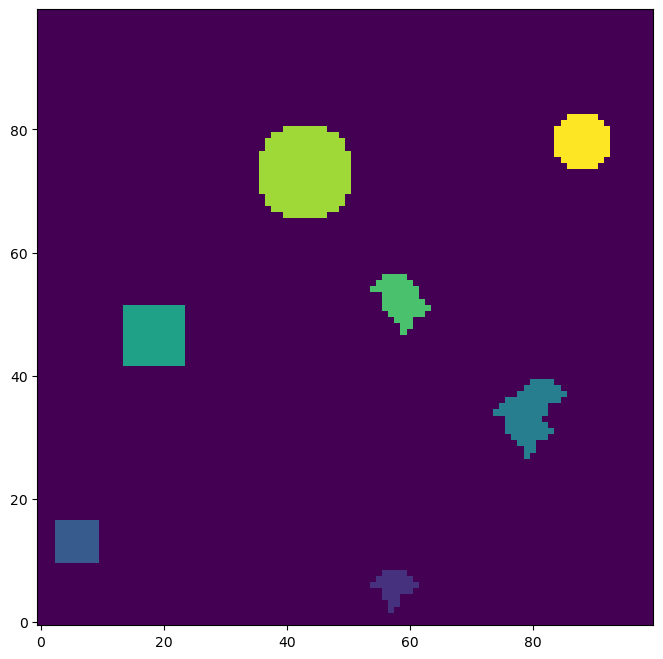

In [39]:
labels = skm.label(mimg)
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.imshow(labels, origin="lower")

In [40]:
properties = ["label", "area", "area_bbox", "bbox"]

print("regionprops")
props = skm.regionprops(labels, mimg)
for prop in props:
    ostr = ""
    for ptype in properties:
        ostr += f" {ptype}={getattr(prop, ptype)} "
    print(ostr)

print("regionprops_table")
props_tbl = skm.regionprops_table(labels, mimg, properties=properties)
for key, val in props_tbl.items():
    print(key, val)

print("astropy table")
astropy_tbl = ap.util.regionprops_to_astropy_table(labels, mimg, properties=properties)
print(astropy_tbl)

regionprops
 label=1  area=29.0  area_bbox=56.0  bbox=(2, 54, 9, 62) 
 label=2  area=49.0  area_bbox=49.0  bbox=(10, 3, 17, 10) 
 label=3  area=77.0  area_bbox=156.0  bbox=(27, 74, 40, 86) 
 label=4  area=100.0  area_bbox=100.0  bbox=(42, 14, 52, 24) 
 label=5  area=51.0  area_bbox=100.0  bbox=(47, 54, 57, 64) 
 label=6  area=193.0  area_bbox=225.0  bbox=(66, 36, 81, 51) 
 label=7  area=69.0  area_bbox=81.0  bbox=(74, 84, 83, 93) 
regionprops_table
label [1 2 3 4 5 6 7]
area [ 29.  49.  77. 100.  51. 193.  69.]
area_bbox [ 56.  49. 156. 100. 100. 225.  81.]
bbox-0 [ 2 10 27 42 47 66 74]
bbox-1 [54  3 74 14 54 36 84]
bbox-2 [ 9 17 40 52 57 81 83]
bbox-3 [62 10 86 24 64 51 93]
astropy table
label  area area_bbox bbox_rmin bbox_cmin bbox_rmax bbox_cmax
----- ----- --------- --------- --------- --------- ---------
    1  29.0      56.0         2        54         9        62
    2  49.0      49.0        10         3        17        10
    3  77.0     156.0        27        74        40   

In [41]:
hole_fixer = ap.ApFixHoles('debug')
(newdata, metadata) = hole_fixer.fix_holes(cimg, mimg, hfillmin=20, hfilltgt=2.0, verbose=True)

2025-03-15 15:23:07,365 | ApFixHoles | DEBUG | ApFixHoles instance constructed.
2025-03-15 15:23:07,366 | ApFixHoles | INFO | fix_holes: data has 100 rows x 100 columns, dtype=int64
2025-03-15 15:23:07,366 | ApFixHoles | INFO | fix_holes: mask has 100 rows x 100 columns, dtype=int64
2025-03-15 15:23:07,366 | ApFixHoles | WARNING | Pixel medians may suffer from casting truncation because the input data is not a floating point datatype (int64).
2025-03-15 15:23:07,372 | ApFixHoles | DEBUG | Number of holes in mask: 7
2025-03-15 15:23:07,372 | ApFixHoles | DEBUG | Percentage of pixels considered bad: 5.680 (568/10000)
2025-03-15 15:23:07,372 | ApFixHoles | DEBUG | Hole 1, 29 bad pix, initial bounding box 56 pix, final bounding box 110 pix after 1 rounds of growth, has 81 good pixels (good to bad pixel ratio=2.79)
2025-03-15 15:23:07,373 | ApGaussianVariateFiller | DEBUG | Input hole has median=23.00 +/- 5.58 counts per pixel.
2025-03-15 15:23:07,373 | ApGaussianVariateFiller | DEBUG | Sur

Diagnostics of the first 40 holes follow:
hole_num  bbox_rmin  bbox_rmax  bbox_cmin  bbox_cmax  hole_npix  hole_medn   hole_std    npix_good  fix_medn    fix_std    
1                 1         11         53         64         29     23.00        5.58         81     22.00        4.75  
2                 8         21          1         14         49     24.00        4.04        120     25.00        4.38  
3                26         42         73         88         77     26.00        5.58        163     25.00        4.19  
4                39         58         11         30        100     24.00        4.71        261     23.00        4.88  
5                46         59         53         66         51     26.00        4.47        118     27.00        5.53  
6                62         89         32         59        193     26.00        5.26        536     25.00        5.41  
7                72         87         82         97         69     27.00        5.04        156     28.00  

In [42]:
print(f'Output fixed image is {newdata.size} pixels, {newdata.shape[0]} rows x {newdata.shape[1]} cols')

Output fixed image is 10000 pixels, 100 rows x 100 cols


In [43]:
for key, val in metadata.items():
    print(f'{key:<10s}: {val}')

HOLENBAD  : (7, ' Number of holes in the input mask')
HOLENPIX  : (np.int64(568), ' Number of bad pixels in the hole mask')
HFILLMIN  : (20, 'Minimum number of good pixels sampled around each hole')
HFILLTGT  : (2.0, 'Target ratio of good pixels to hole pixels')
HOLECORR  : (True, 'True if any holes were corrected')
HOLENFIX  : (np.int64(568), 'Number of bad pixels corrected')


APFixHoles difference image data min=-22.00, max=22.00, mean=-0.04 +/- 1.62, median=0.00 ADU.
  90% of data between 0.00 and 0.00 ADU (5-95 precentiles)
  98% of data between -7.00 and 6.00 ADU (1-99 precentiles)


Text(0.5, 1.0, 'Counts image with Poisson noise')

Text(0.5, 1.0, 'ApFixHoles filled data')

Text(0.5, 1.0, 'Mask')

Text(0.5, 1.0, 'ApFixHoles difference newdfata - cimg')

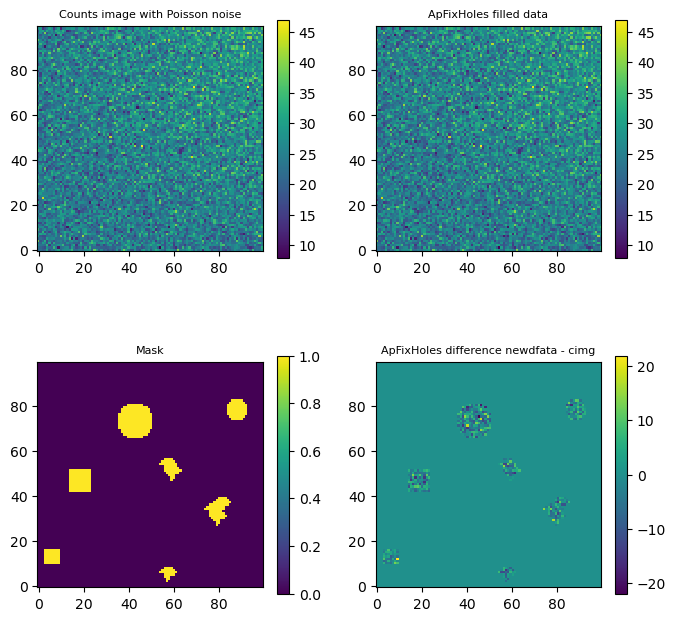

In [44]:
diff_img = newdata - cimg
[df_minval, df_maxval, df_meanval, df_stdval, df_medval] = ap.util.img_stats(diff_img, 'APFixHoles difference image', True)

fig, axarr = plt.subplots(2, 2, figsize=(8, 8))
ax1 = axarr[0][0]
ax2 = axarr[0][1]
ax3 = axarr[1][0]
ax4 = axarr[1][1]

im = ax1.imshow(cimg, origin="lower", interpolation="nearest")
ax1.set_title("Counts image with Poisson noise", fontsize=8)
cbar1 = fig.colorbar(
    im,
    ax=ax1,
    extend="neither",
    spacing="proportional",
    orientation="vertical",
    shrink=0.85,
)

im = ax2.imshow(newdata, origin="lower", interpolation="nearest")
ax2.set_title("ApFixHoles filled data", fontsize=8)
cbar2 = fig.colorbar(
    im,
    ax=ax2,
    extend="neither",
    spacing="proportional",
    orientation="vertical",
    shrink=0.85,
)

im = ax3.imshow(mimg, origin="lower", interpolation="nearest")
ax3.set_title("Mask", fontsize=8)
cbar3 = fig.colorbar(
    im,
    ax=ax3,
    extend="neither",
    spacing="proportional",
    orientation="vertical",
    shrink=0.85,
)

im = ax4.imshow(diff_img, origin="lower", interpolation="nearest")
ax4.set_title("ApFixHoles difference newdfata - cimg", fontsize=8)
cbar4 = fig.colorbar(
    im,
    ax=ax4,
    extend="neither",
    spacing="proportional",
    orientation="vertical",
    shrink=0.85,
)


## ApFixHoles On The T33 Example Image

Here we will use the master hole mask generated earlier that included pre-correcting bad pixels in the master flats before the gradient thresholding.

In [45]:
# Close all the open figures in memory
plt.close('all')

In [46]:
del hole_fixer
hole_fixer = ap.ApFixHoles('info')

In [47]:
def quick_plot_region2(imdata, x_limits, y_limits, title_str, vmin: float = None,
    vmax: float = None, verbose: bool = False, output=None):
    ipctls = [1.0, 99.0]
    opctls = np.nanpercentile(imdata, ipctls)
    ourmin = opctls[0]
    ourmax = opctls[1]
    if verbose:
        print(f"Input data 1.0th percentile = {ourmin:.4f}, 99.0th percentile = {ourmax:.4f}")

    default_font_size = 7
    ##alt_x_limits=[2100, 2700]
    ##alt_y_limits=[2200, 2800]
    alt_x_limits=[1800, 2400]
    alt_y_limits=[2400, 3000]
    
    if vmin is not None:
        ourmin = vmin
    if vmax is not None:
        ourmax = vmax
    if verbose:
        print(f"Applying asinh stretch between {ourmin:.4f} and {ourmax:.4f}")
    norm = ImageNormalize(
        imdata, interval=ManualInterval(ourmin, ourmax), stretch=AsinhStretch()
    )
    
    fig, axs = plt.subplots(1, 2, layout="constrained")
    axim1 = axs[0].imshow(imdata, origin="lower", norm=norm)
    axs[0].set_title(title_str, fontsize=8)
    axs[0].set_xbound(lower=alt_x_limits[0], upper=alt_x_limits[1])
    axs[0].set_ybound(lower=alt_y_limits[0], upper=alt_y_limits[1])
    axs[0].tick_params(labelsize=default_font_size)
    cbar1 = fig.colorbar(
        axim1,
        ax=axs[0],
        extend="neither",
        spacing="proportional",
        orientation="vertical",
        shrink=0.75,
    )
    cbar1.ax.tick_params(labelsize=default_font_size)
    
    axim2 = axs[1].imshow(imdata, origin="lower", norm=norm)
    axs[1].set_title(f'zoomed: {title_str}', fontsize=8)
    axs[1].set_xbound(lower=x_limits[0], upper=x_limits[1])
    axs[1].set_ybound(lower=y_limits[0], upper=y_limits[1])
    axs[1].tick_params(labelsize=default_font_size)
    cbar2 = fig.colorbar(
        axim2,
        ax=axs[1],
        extend="neither",
        spacing="proportional",
        orientation="vertical",
        shrink=0.75,
    )
    cbar2.ax.tick_params(labelsize=default_font_size)

    if output is not None:
        if "interactive" in output:
            print("Processing blocked while plotting window is open. Close it to procede.")
            fig.show()
        else:
            fig.savefig(output, dpi=200, bbox_inches="tight")
            if verbose:
                print(f"Wrote plot to {output}")
    return

2025-03-15 15:23:07,815 | ApFixHoles | INFO | fix_holes: data has 4096 rows x 4096 columns, dtype=>f4
2025-03-15 15:23:07,815 | ApFixHoles | INFO | fix_holes: mask has 4096 rows x 4096 columns, dtype=int16
2025-03-15 15:23:07,997 | ApFixHoles | INFO | Processed 548 pixels in 0.078 s, 0.143 ms per hole.


Attempting to fix recalibrated-T33-davestrickland-NGC_253-20240828-010621-Blue-BIN1-E-180-001.fit
Diagnostics of the first 40 holes follow:
hole_num  bbox_rmin  bbox_rmax  bbox_cmin  bbox_cmax  hole_npix  hole_medn   hole_std    npix_good  fix_medn    fix_std    
1                 0          8        430        440         15    109.81       10.67         65    104.73        8.15  
2                 0          7       1234       1245         15    108.51        8.77         62    117.95       13.51  
3                 0         20       1981       2001        107    110.98       10.82        293    109.13       10.98  
4                 2         13       2346       2356         19    105.50        8.53         91    112.67       13.26  
5                16         24       1706       1714         21    120.23       10.72         43    112.36       12.79  
6                21         33       3414       3425         26    110.26       11.65        106    110.73        8.88  
7         

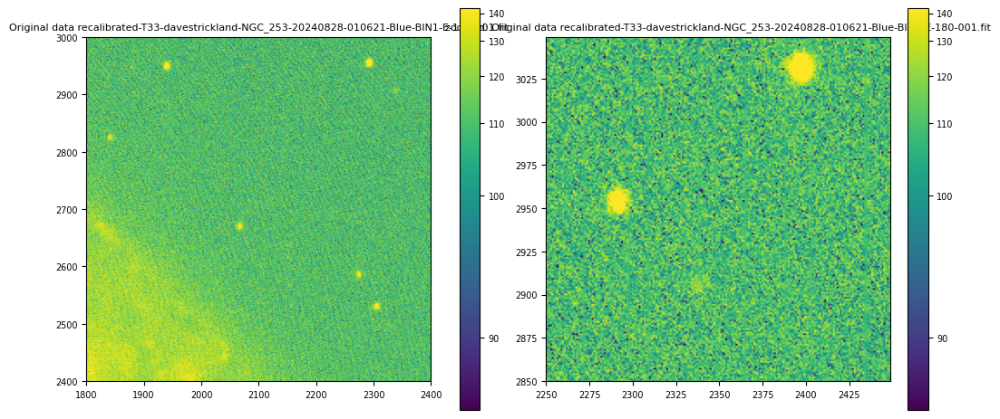

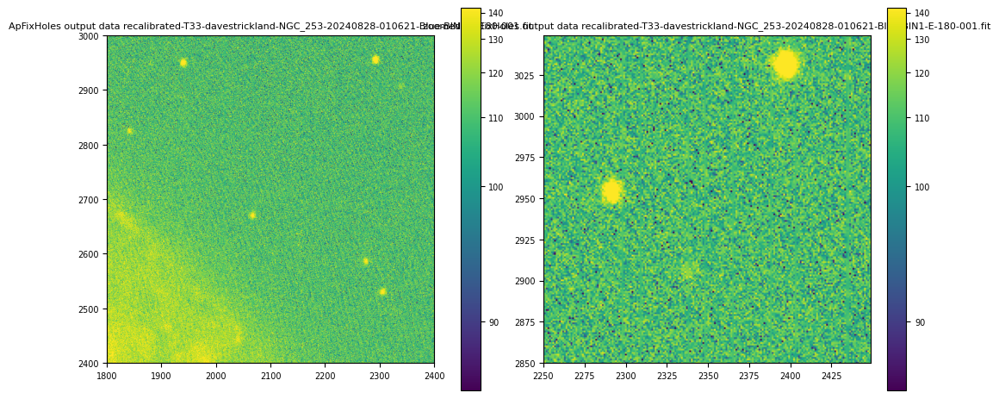

In [48]:
files_to_process = [imlist[2]] #, imlist[2]]
for file in files_to_process:
    print(f'Attempting to fix {file}')

    with fits.open(file) as hdulist:
        original_data = hdulist[0].data
        (fixed_data, metadata) = hole_fixer.fix_holes(original_data, bp_merged_mask, hfillmin=20, hfilltgt=2.0, verbose=True)

        quick_plot_region2(original_data, x_limits, y_limits, f'Original data {file}', output='tmp_holes_calibrated.png')
        quick_plot_region2(fixed_data, x_limits, y_limits, f'ApFixHoles output data {file}', output='tmp_holes_calibrated_fixed.png')

**Summary**: `ApFixHoles` appears to have done a good job inpainting the holes in the image.

In [49]:
# Close all the open figures in memory
plt.close("all")

# Versions and Changes

| Version | Date       | Description |
|:--------|------------|-------------|
| 0.6.0   | 2024-12-15 | Initial version |
| 0.6.2  | 2025-03-15 | Verified working after #30 upgrade to python 3.12 astropy 7.0 |